#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2Reader
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,2048],
        "input_feat":102,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [36]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_feature"
models_saves = "model_saves"

In [3]:
dataReader = PAMAP2Reader('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:87: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.array(data)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [4]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [5]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [6]:
emb = model(torch.randn((32,102)))
emb.size()

torch.Size([32, 2048])

In [7]:
emb

tensor([[0.0000, 0.0000, 0.0000,  ..., 0.1710, 0.0000, 0.0000],
        [0.0000, 0.1269, 1.4259,  ..., 0.0000, 0.9514, 0.0000],
        [0.3047, 0.0000, 0.3174,  ..., 0.5847, 1.0069, 0.0000],
        ...,
        [0.0000, 0.5691, 0.5401,  ..., 0.5817, 0.0000, 0.0361],
        [0.0996, 0.8740, 0.9468,  ..., 0.0000, 0.0000, 0.3097],
        [0.0000, 2.7710, 0.7550,  ..., 0.2783, 1.0578, 0.0000]],
       grad_fn=<ReluBackward0>)

---

In [8]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [9]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [10]:
dataReader.data.shape

(124,)

In [11]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [12]:
dts = PAMAP2Dataset

In [13]:
video_data = np.load('data/I3D/video_feat/PAMAP2_K10_V1/feat_dict_2048.npz')
video_classes, video_feat = video_data['activity'], video_data['features']

In [14]:
video_feat.shape

(180, 2048)

In [15]:
np.unique(video_classes, return_counts=True)

(array(['Nordic walking', 'ascending stairs', 'car driving',
        'computer work', 'cycling', 'descending stairs', 'folding laundry',
        'house cleaning', 'ironing', 'lying', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 array([10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
        10], dtype=int64))

In [16]:
vid_cls_name = np.unique(video_classes)

In [17]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [18]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 2048])

In [19]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [20]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [21]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [22]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [23]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [24]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 102), (16752,))

In [25]:
action_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [26]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [27]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [28]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [29]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
             9: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
             8: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
             5: [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
             11: [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
             14: [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
             15: [60, 61, 62, 63, 64, 65, 66, 67, 68, 69],
             13: [70, 71, 72, 73, 74, 75, 76, 77, 78, 79],
             0: [80, 81, 82, 83, 84, 85, 86, 87, 88, 89],
             6: [90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
             16: [100, 101, 102, 103, 104, 105, 106, 107, 108, 109],
             17: [110, 111, 112, 113, 114, 115, 116, 117, 118, 119],
             4: [120, 121, 122, 123, 124, 125, 126, 127, 128, 129],
             1: [130, 131, 132, 133, 134, 135, 136, 137, 138, 139],
             2: [140, 141, 142, 143, 144, 145, 146, 147, 148, 149],
             12: [150, 151, 152, 153, 154, 155, 156, 157, 158, 15

In [30]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 2048])

In [31]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [32]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [33]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss - loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [34]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss - loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}


D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 261/261 [00:48<00:00,  5.40batch/s, loss=4.67, accuracy=0.812]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.67batch/s, loss=4.87]


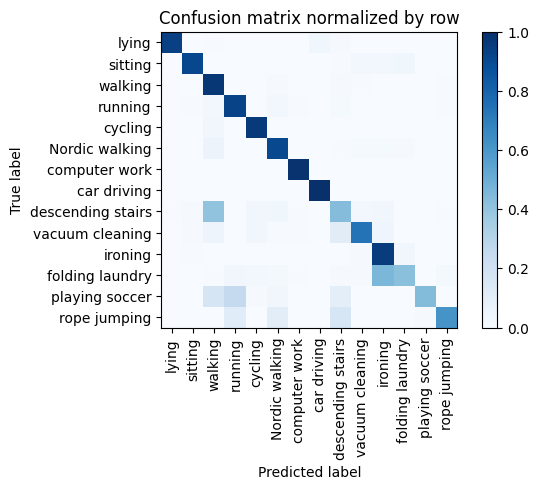

Training Epoch:   7%|▋         | 1/15 [00:54<12:37, 54.12s/it]

Overall accuracy: 0.866

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.986      0.989      0.141        586|	 ironing: 0.003,	vacuum cleaning: 0.003,	
          ironing       0.790      0.953      0.864      0.118        490|	 folding laundry: 0.035,	vacuum cleaning: 0.008,	
          walking       0.767      0.969      0.856      0.117        486|	 descending stairs: 0.008,	Nordic walking: 0.008,	
          sitting       0.974      0.907      0.939      0.088        365|	 folding laundry: 0.038,	ironing: 0.025,	
   Nordic walking       0.906      0.903      0.904      0.087        361|	 walking: 0.055,	ironing: 0.014,	
            lying       0.997      0.935      0.965      0.086        356|	 car driving: 0.037,	descending stairs: 0.011,	
  vacuum cleaning       0.896      0.740      0.811      0.084        350|	 descending stairs: 0.111,	walking: 0.049,	
          cycling       0.920      0.961      


train: 100%|██████████| 261/261 [00:49<00:00,  5.23batch/s, loss=3.82, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.51batch/s, loss=3.29]


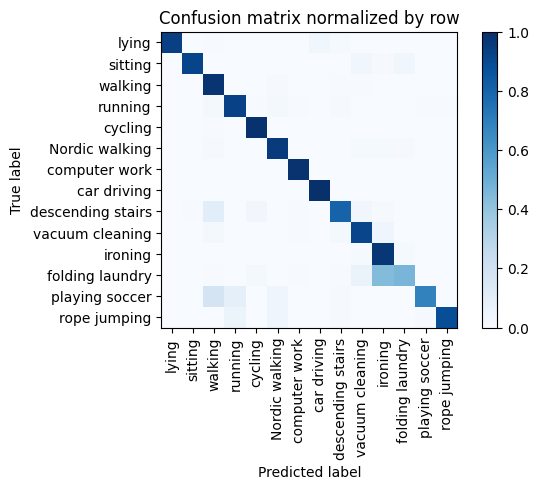

Training Epoch:  13%|█▎        | 2/15 [01:49<11:53, 54.86s/it]

Overall accuracy: 0.922

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.986      0.989      0.141        588|	 vacuum cleaning: 0.003,	descending stairs: 0.003,	
          ironing       0.814      0.971      0.886      0.118        490|	 folding laundry: 0.014,	vacuum cleaning: 0.012,	
          walking       0.898      0.977      0.936      0.117        485|	 Nordic walking: 0.008,	vacuum cleaning: 0.006,	
          sitting       0.991      0.920      0.954      0.087        364|	 folding laundry: 0.036,	vacuum cleaning: 0.033,	
   Nordic walking       0.956      0.956      0.956      0.087        363|	 ironing: 0.014,	vacuum cleaning: 0.014,	
            lying       1.000      0.936      0.967      0.086        357|	 car driving: 0.036,	descending stairs: 0.014,	
  vacuum cleaning       0.873      0.917      0.894      0.084        351|	 ironing: 0.040,	walking: 0.020,	
          cycling       0.962   


train: 100%|██████████| 261/261 [00:53<00:00,  4.92batch/s, loss=4.07, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.45batch/s, loss=3.32]


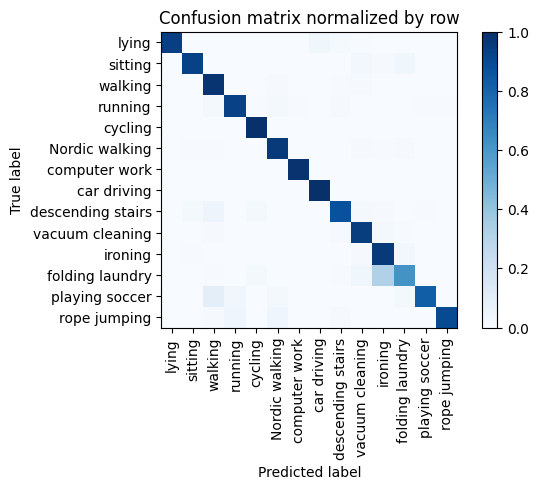

Training Epoch:  20%|██        | 3/15 [02:49<11:25, 57.14s/it]

Overall accuracy: 0.939

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.988      0.992      0.141        588|	 vacuum cleaning: 0.003,	cycling: 0.003,	
          ironing       0.861      0.959      0.908      0.118        492|	 folding laundry: 0.026,	vacuum cleaning: 0.010,	
          walking       0.940      0.977      0.958      0.116        483|	 vacuum cleaning: 0.008,	Nordic walking: 0.008,	
          sitting       0.974      0.926      0.950      0.088        366|	 folding laundry: 0.036,	vacuum cleaning: 0.027,	
   Nordic walking       0.961      0.961      0.961      0.086        359|	 folding laundry: 0.011,	vacuum cleaning: 0.011,	
            lying       1.000      0.938      0.968      0.086        357|	 car driving: 0.036,	descending stairs: 0.014,	
  vacuum cleaning       0.898      0.946      0.921      0.085        352|	 ironing: 0.023,	walking: 0.011,	
          cycling       0.969     


train: 100%|██████████| 261/261 [00:55<00:00,  4.66batch/s, loss=3.99, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00, 10.11batch/s, loss=4.25]


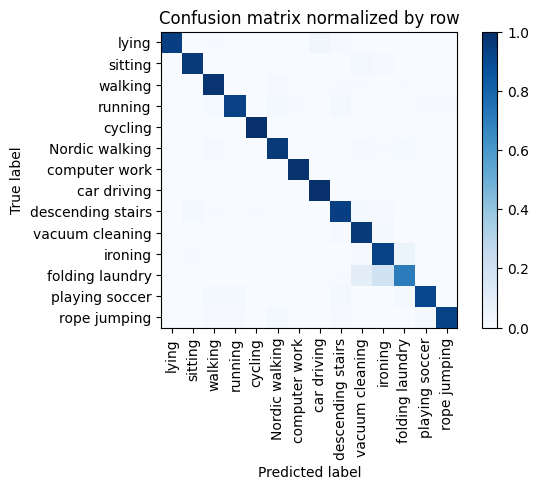

Training Epoch:  27%|██▋       | 4/15 [03:52<10:53, 59.44s/it]

Overall accuracy: 0.948

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.986      0.991      0.142        590|	 folding laundry: 0.003,	ironing: 0.003,	
          ironing       0.892      0.928      0.909      0.117        487|	 folding laundry: 0.060,	vacuum cleaning: 0.008,	
          walking       0.971      0.977      0.974      0.117        485|	 Nordic walking: 0.008,	folding laundry: 0.004,	
          sitting       0.975      0.962      0.968      0.088        365|	 vacuum cleaning: 0.027,	ironing: 0.008,	
   Nordic walking       0.972      0.958      0.965      0.086        358|	 folding laundry: 0.014,	vacuum cleaning: 0.011,	
            lying       1.000      0.941      0.970      0.086        358|	 car driving: 0.036,	descending stairs: 0.011,	
  vacuum cleaning       0.885      0.958      0.920      0.085        355|	 ironing: 0.023,	descending stairs: 0.011,	
          cycling       0.997   


train: 100%|██████████| 261/261 [00:56<00:00,  4.62batch/s, loss=3.55, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.81batch/s, loss=3.41]


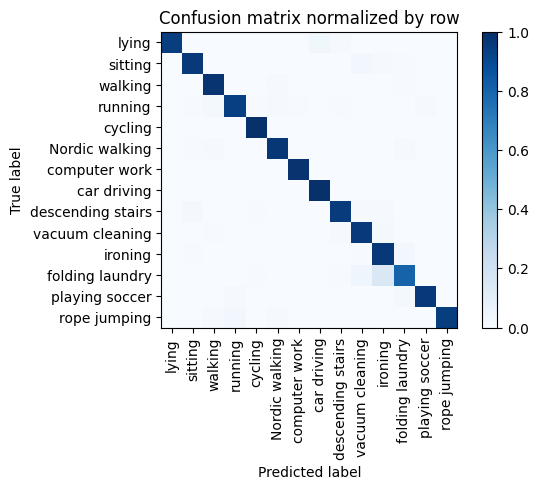

Training Epoch:  33%|███▎      | 5/15 [04:56<10:10, 61.02s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.988      0.992      0.142        589|	 folding laundry: 0.003,	vacuum cleaning: 0.003,	
          ironing       0.920      0.965      0.942      0.118        489|	 folding laundry: 0.025,	vacuum cleaning: 0.006,	
          walking       0.979      0.979      0.979      0.116        484|	 Nordic walking: 0.010,	folding laundry: 0.004,	
          sitting       0.970      0.959      0.964      0.088        368|	 vacuum cleaning: 0.024,	ironing: 0.008,	
   Nordic walking       0.978      0.972      0.975      0.087        361|	 folding laundry: 0.011,	walking: 0.008,	
            lying       1.000      0.947      0.973      0.086        357|	 car driving: 0.036,	descending stairs: 0.008,	
  vacuum cleaning       0.928      0.963      0.945      0.084        350|	 ironing: 0.017,	descending stairs: 0.009,	
          cycling       0.987   


train: 100%|██████████| 261/261 [00:57<00:00,  4.52batch/s, loss=3.46, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.96batch/s, loss=2.98]


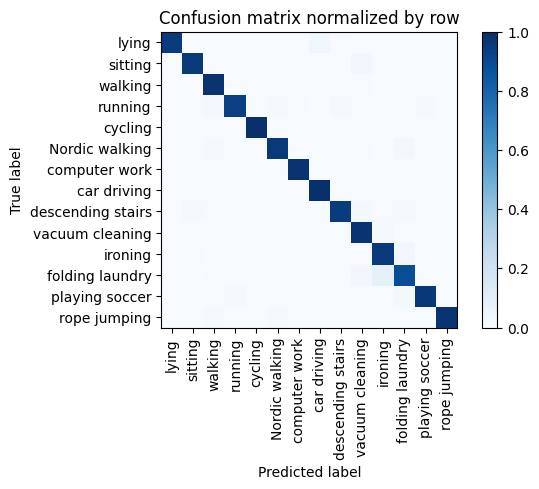

Training Epoch:  40%|████      | 6/15 [06:01<09:21, 62.38s/it]

Overall accuracy: 0.968

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.988      0.993      0.142        589|	 folding laundry: 0.003,	ironing: 0.003,	
          ironing       0.946      0.963      0.954      0.117        487|	 folding laundry: 0.027,	vacuum cleaning: 0.006,	
          walking       0.975      0.988      0.981      0.116        482|	 folding laundry: 0.004,	vacuum cleaning: 0.004,	
          sitting       0.981      0.959      0.970      0.088        367|	 vacuum cleaning: 0.027,	folding laundry: 0.005,	
   Nordic walking       0.991      0.964      0.977      0.086        359|	 folding laundry: 0.019,	walking: 0.011,	
            lying       1.000      0.950      0.974      0.086        359|	 car driving: 0.036,	descending stairs: 0.006,	
  vacuum cleaning       0.928      0.977      0.952      0.085        355|	 ironing: 0.014,	descending stairs: 0.006,	
          cycling       0.997  


train: 100%|██████████| 261/261 [00:57<00:00,  4.53batch/s, loss=4.81, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.09batch/s, loss=3.2]


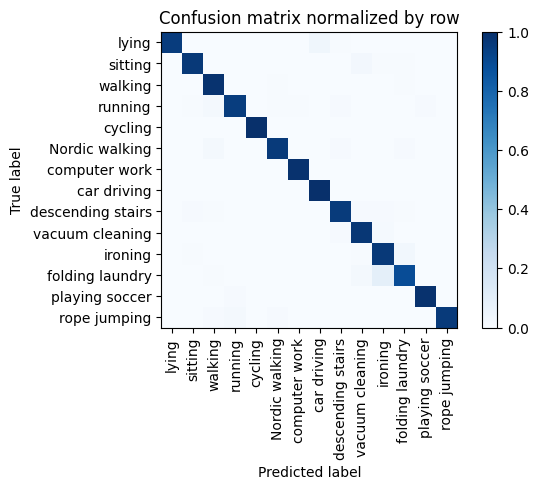

Training Epoch:  47%|████▋     | 7/15 [07:06<08:26, 63.35s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.990      0.993      0.142        590|	 folding laundry: 0.003,	ironing: 0.003,	
          ironing       0.940      0.961      0.950      0.117        488|	 folding laundry: 0.029,	sitting: 0.006,	
          walking       0.971      0.985      0.978      0.116        482|	 folding laundry: 0.004,	Nordic walking: 0.004,	
          sitting       0.978      0.962      0.970      0.088        366|	 vacuum cleaning: 0.025,	folding laundry: 0.005,	
   Nordic walking       0.989      0.958      0.973      0.087        361|	 walking: 0.017,	folding laundry: 0.011,	
            lying       1.000      0.950      0.974      0.087        360|	 car driving: 0.036,	descending stairs: 0.006,	
  vacuum cleaning       0.947      0.969      0.958      0.085        353|	 ironing: 0.014,	descending stairs: 0.011,	
          cycling       1.000      0.997


train: 100%|██████████| 261/261 [00:58<00:00,  4.45batch/s, loss=3.49, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.56batch/s, loss=3.11]


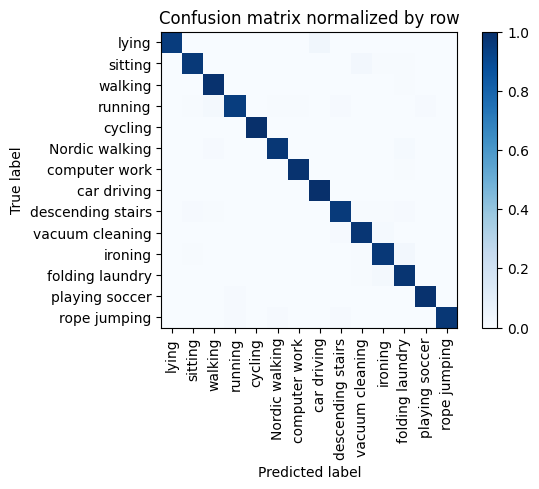

Training Epoch:  53%|█████▎    | 8/15 [08:12<07:29, 64.23s/it]

Overall accuracy: 0.975

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.988      0.992      0.142        591|	 folding laundry: 0.005,	ironing: 0.003,	
          ironing       0.971      0.965      0.968      0.118        489|	 folding laundry: 0.025,	vacuum cleaning: 0.006,	
          walking       0.979      0.990      0.984      0.115        480|	 folding laundry: 0.004,	vacuum cleaning: 0.002,	
          sitting       0.983      0.962      0.972      0.088        367|	 vacuum cleaning: 0.025,	folding laundry: 0.005,	
   Nordic walking       0.994      0.972      0.983      0.087        361|	 folding laundry: 0.014,	walking: 0.011,	
            lying       1.000      0.952      0.976      0.086        357|	 car driving: 0.034,	folding laundry: 0.003,	
  vacuum cleaning       0.950      0.975      0.962      0.085        353|	 ironing: 0.014,	descending stairs: 0.008,	
          cycling       1.000    


train: 100%|██████████| 261/261 [00:58<00:00,  4.43batch/s, loss=3.62, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.17batch/s, loss=3.2] 


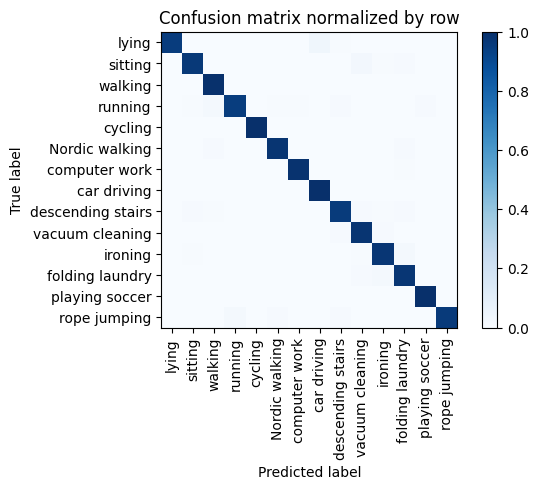

Training Epoch:  60%|██████    | 9/15 [09:19<06:30, 65.05s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.988      0.993      0.141        588|	 folding laundry: 0.005,	ironing: 0.003,	
          walking       0.982      0.996      0.989      0.117        486|	 vacuum cleaning: 0.002,	sitting: 0.002,	
          ironing       0.975      0.973      0.974      0.116        483|	 folding laundry: 0.017,	sitting: 0.006,	
          sitting       0.975      0.962      0.968      0.088        365|	 vacuum cleaning: 0.025,	folding laundry: 0.008,	
   Nordic walking       0.994      0.978      0.986      0.087        362|	 folding laundry: 0.011,	walking: 0.008,	
            lying       1.000      0.950      0.974      0.086        357|	 car driving: 0.036,	descending stairs: 0.006,	
  vacuum cleaning       0.951      0.980      0.965      0.085        353|	 ironing: 0.008,	descending stairs: 0.008,	
          cycling       1.000      0.997      0


train: 100%|██████████| 261/261 [00:59<00:00,  4.40batch/s, loss=3.03, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.26batch/s, loss=3.79]


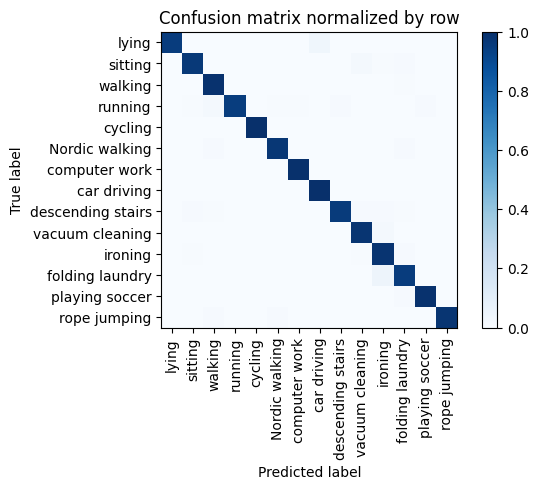

Training Epoch:  67%|██████▋   | 10/15 [10:26<05:28, 65.65s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.993      0.995      0.142        589|	 ironing: 0.003,	vacuum cleaning: 0.003,	
          ironing       0.954      0.982      0.968      0.118        489|	 folding laundry: 0.008,	sitting: 0.006,	
          walking       0.979      0.992      0.986      0.115        480|	 folding laundry: 0.004,	vacuum cleaning: 0.002,	
          sitting       0.978      0.965      0.971      0.088        367|	 vacuum cleaning: 0.022,	folding laundry: 0.008,	
            lying       1.000      0.950      0.974      0.087        360|	 car driving: 0.036,	folding laundry: 0.003,	
   Nordic walking       0.994      0.972      0.983      0.086        359|	 folding laundry: 0.011,	walking: 0.008,	
  vacuum cleaning       0.956      0.977      0.966      0.085        354|	 ironing: 0.017,	descending stairs: 0.003,	
          cycling       1.000      0.997 


train: 100%|██████████| 261/261 [00:59<00:00,  4.38batch/s, loss=3.48, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.01batch/s, loss=3.15]


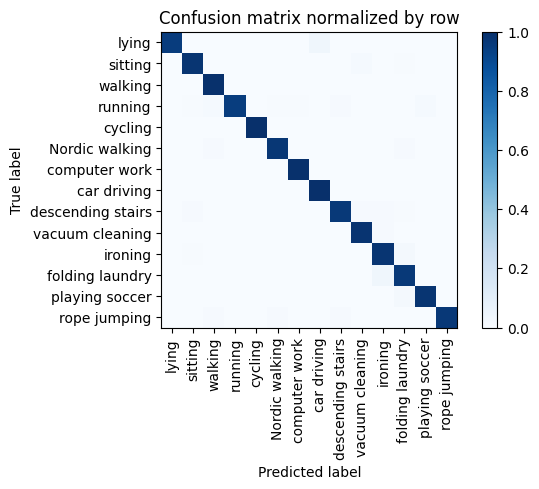

Training Epoch:  73%|███████▎  | 11/15 [11:33<04:24, 66.21s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.995      0.997      0.141        587|	 ironing: 0.003,	vacuum cleaning: 0.002,	
          ironing       0.964      0.980      0.972      0.118        492|	 folding laundry: 0.016,	sitting: 0.004,	
          walking       0.982      0.994      0.988      0.116        482|	 vacuum cleaning: 0.002,	Nordic walking: 0.002,	
          sitting       0.984      0.978      0.981      0.088        367|	 vacuum cleaning: 0.014,	folding laundry: 0.005,	
   Nordic walking       0.992      0.972      0.982      0.087        360|	 folding laundry: 0.011,	walking: 0.008,	
            lying       1.000      0.950      0.974      0.086        359|	 car driving: 0.036,	folding laundry: 0.003,	
  vacuum cleaning       0.969      0.983      0.976      0.084        351|	 ironing: 0.011,	folding laundry: 0.003,	
          cycling       1.000      0.997    


train: 100%|██████████| 261/261 [00:59<00:00,  4.40batch/s, loss=3.3, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.19batch/s, loss=3.69]


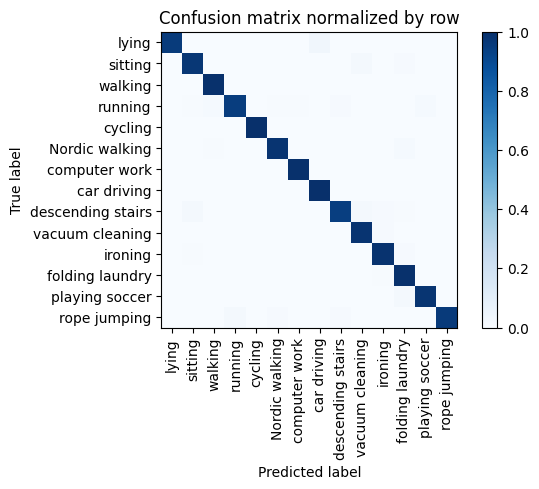

Training Epoch:  80%|████████  | 12/15 [12:40<03:19, 66.47s/it]

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.995      0.997      0.141        588|	 vacuum cleaning: 0.003,	ironing: 0.002,	
          ironing       0.980      0.988      0.984      0.118        491|	 folding laundry: 0.008,	sitting: 0.004,	
          walking       0.988      0.994      0.991      0.117        486|	 folding laundry: 0.002,	vacuum cleaning: 0.002,	
          sitting       0.981      0.973      0.977      0.087        364|	 vacuum cleaning: 0.016,	folding laundry: 0.008,	
   Nordic walking       0.994      0.981      0.987      0.087        360|	 folding laundry: 0.014,	walking: 0.006,	
            lying       1.000      0.955      0.977      0.086        356|	 car driving: 0.034,	ironing: 0.003,	
  vacuum cleaning       0.961      0.983      0.972      0.084        351|	 ironing: 0.011,	folding laundry: 0.003,	
          cycling       1.000      0.997      0.998


train: 100%|██████████| 261/261 [01:01<00:00,  4.26batch/s, loss=3.25, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.09batch/s, loss=2.85]


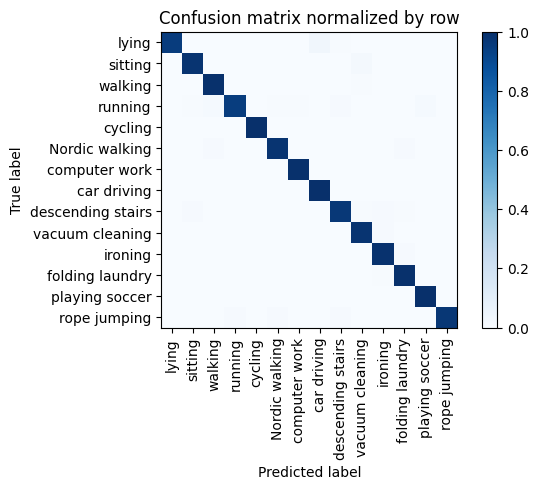

Training Epoch:  87%|████████▋ | 13/15 [13:50<02:14, 67.26s/it]

Overall accuracy: 0.983

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.995      0.997      0.141        587|	 vacuum cleaning: 0.003,	ironing: 0.002,	
          ironing       0.982      0.990      0.986      0.118        491|	 folding laundry: 0.008,	sitting: 0.002,	
          walking       0.984      0.996      0.990      0.115        479|	 vacuum cleaning: 0.004,	rope jumping: 0.000,	
          sitting       0.986      0.981      0.984      0.088        368|	 vacuum cleaning: 0.016,	ironing: 0.003,	
   Nordic walking       0.994      0.981      0.987      0.087        362|	 walking: 0.011,	folding laundry: 0.008,	
            lying       1.000      0.953      0.976      0.086        359|	 car driving: 0.033,	descending stairs: 0.006,	
  vacuum cleaning       0.967      0.983      0.975      0.085        353|	 ironing: 0.011,	descending stairs: 0.003,	
          cycling       1.000      0.997      0.99


train: 100%|██████████| 261/261 [01:01<00:00,  4.25batch/s, loss=3.37, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.15batch/s, loss=2.83]


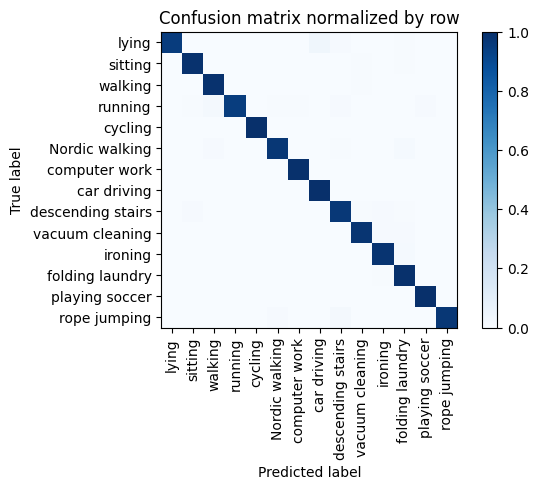

Training Epoch:  93%|█████████▎| 14/15 [14:59<01:07, 67.83s/it]

Overall accuracy: 0.981

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.995      0.997      0.142        589|	 ironing: 0.002,	vacuum cleaning: 0.002,	
          ironing       0.984      0.984      0.984      0.117        487|	 folding laundry: 0.012,	vacuum cleaning: 0.002,	
          walking       0.984      0.992      0.988      0.116        481|	 vacuum cleaning: 0.006,	sitting: 0.002,	
          sitting       0.984      0.989      0.986      0.088        367|	 folding laundry: 0.005,	vacuum cleaning: 0.005,	
   Nordic walking       0.994      0.969      0.982      0.086        359|	 folding laundry: 0.014,	walking: 0.011,	
            lying       1.000      0.950      0.974      0.086        359|	 car driving: 0.036,	descending stairs: 0.008,	
  vacuum cleaning       0.977      0.977      0.977      0.085        353|	 ironing: 0.011,	folding laundry: 0.008,	
          cycling       1.000      0.997 


train: 100%|██████████| 261/261 [01:01<00:00,  4.23batch/s, loss=3.2, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.98batch/s, loss=3.1]


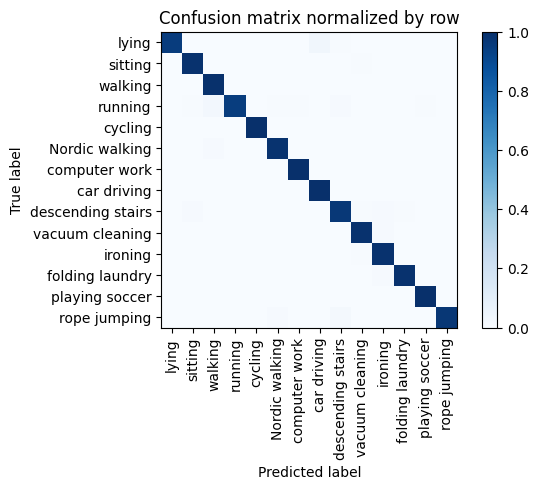

Overall accuracy: 0.986

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.997      0.997      0.142        589|	 vacuum cleaning: 0.003,	rope jumping: 0.000,	
          ironing       0.980      0.992      0.986      0.116        484|	 vacuum cleaning: 0.004,	folding laundry: 0.002,	
          walking       0.984      0.996      0.990      0.116        484|	 vacuum cleaning: 0.002,	sitting: 0.002,	
          sitting       0.981      0.992      0.986      0.088        365|	 vacuum cleaning: 0.005,	ironing: 0.003,	
   Nordic walking       0.994      0.986      0.990      0.087        362|	 walking: 0.008,	ironing: 0.003,	
            lying       1.000      0.953      0.976      0.086        358|	 car driving: 0.034,	descending stairs: 0.006,	
  vacuum cleaning       0.975      0.989      0.982      0.085        353|	 ironing: 0.008,	descending stairs: 0.003,	
          cycling       1.000      0.997      0.99

torch.Size([4, 2048])


unseen: 100%|██████████| 87/87 [00:09<00:00,  9.66batch/s, loss=3.41]


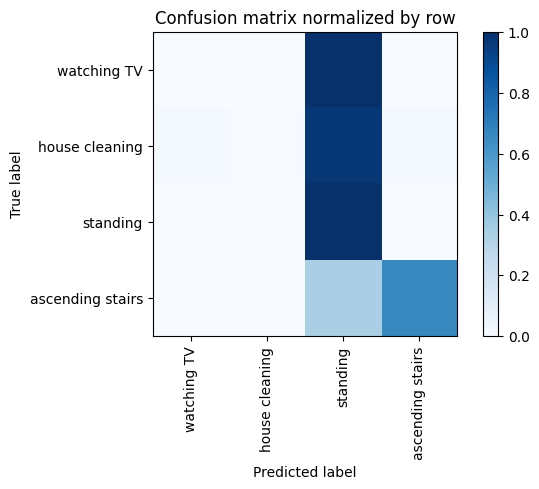

Overall accuracy: 0.459

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.382      0.996      0.553      0.330       1839|	 watching TV: 0.004,	ascending stairs: 0.000,	
  house cleaning       1.000      0.005      0.010      0.328       1829|	 standing: 0.969,	watching TV: 0.014,	ascending stairs: 0.012,	
ascending stairs       0.970      0.664      0.788      0.193       1074|	 standing: 0.336,	house cleaning: 0.000,	
     watching TV       0.000      0.000      0.000      0.148        826|	 standing: 1.000,	ascending stairs: 0.000,	house cleaning: 0.000,	

----------------------------------------------------------------------------------------------------
     avg / total       0.642      0.459      0.338 0.9999999999999999       5568|	      

{'accuracy': 0.4586925287356322, 'precision': 0.5881129157987552, 'recall': 0.41624691893810206, 'f1': 0.33767839725335425}
================ Fold-1 ================
Unseen Cla

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16]
unseen classes >  [3, 17, 1, 11]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 262/262 [00:57<00:00,  4.55batch/s, loss=4.12, accuracy=0.828]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.60batch/s, loss=3.72]


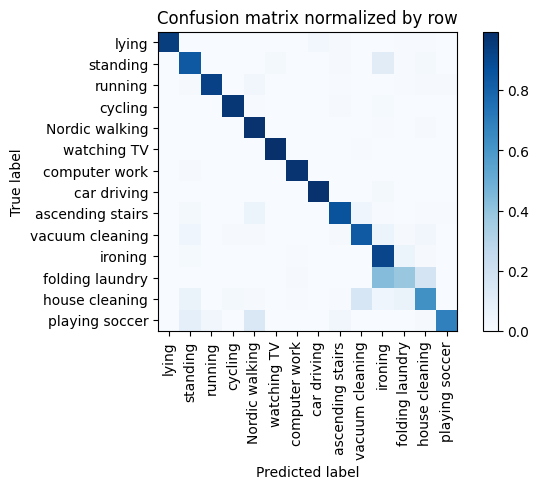

Training Epoch:   7%|▋         | 1/15 [01:05<15:10, 65.05s/it]

Overall accuracy: 0.870

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.986      0.979      0.982      0.136        564|	 standing: 0.011,	ironing: 0.004,	
         ironing       0.722      0.912      0.806      0.117        488|	 folding laundry: 0.059,	standing: 0.014,	
  Nordic walking       0.898      0.979      0.937      0.093        388|	 house cleaning: 0.010,	ironing: 0.005,	
        standing       0.825      0.837      0.831      0.088        367|	 ironing: 0.109,	house cleaning: 0.022,	
  house cleaning       0.763      0.622      0.685      0.085        352|	 vacuum cleaning: 0.159,	folding laundry: 0.065,	
 vacuum cleaning       0.811      0.834      0.823      0.084        350|	 ironing: 0.054,	standing: 0.040,	
           lying       1.000      0.943      0.971      0.084        350|	 car driving: 0.026,	ascending stairs: 0.009,	
         cycling       0.957      0.966      0.961      0.071        297|


train: 100%|██████████| 262/262 [00:59<00:00,  4.39batch/s, loss=3.67, accuracy=0.875]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.99batch/s, loss=3.86]


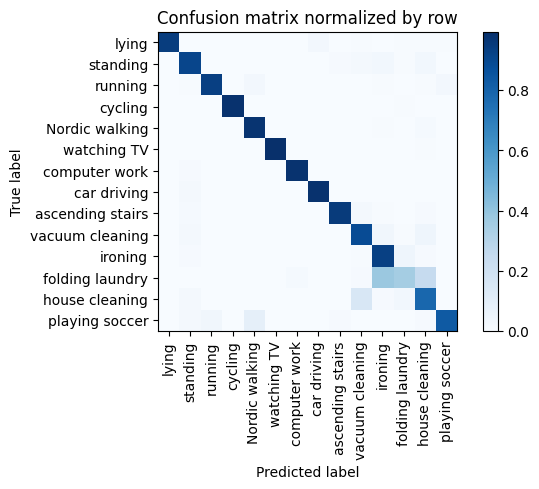

Training Epoch:  13%|█▎        | 2/15 [02:11<14:19, 66.11s/it]

Overall accuracy: 0.905

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.982      0.985      0.136        567|	 standing: 0.009,	house cleaning: 0.004,	
         ironing       0.812      0.932      0.868      0.117        486|	 folding laundry: 0.043,	standing: 0.010,	
  Nordic walking       0.962      0.977      0.969      0.093        385|	 house cleaning: 0.013,	ironing: 0.005,	
        standing       0.910      0.910      0.910      0.088        366|	 ironing: 0.030,	house cleaning: 0.027,	
 vacuum cleaning       0.812      0.886      0.848      0.085        352|	 house cleaning: 0.045,	ironing: 0.031,	
  house cleaning       0.749      0.783      0.766      0.084        351|	 vacuum cleaning: 0.154,	folding laundry: 0.028,	
           lying       1.000      0.943      0.971      0.084        351|	 car driving: 0.026,	playing soccer: 0.006,	
         cycling       0.997      0.983      0.990      0.071 


train: 100%|██████████| 262/262 [00:57<00:00,  4.54batch/s, loss=3.77, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.60batch/s, loss=2.87]


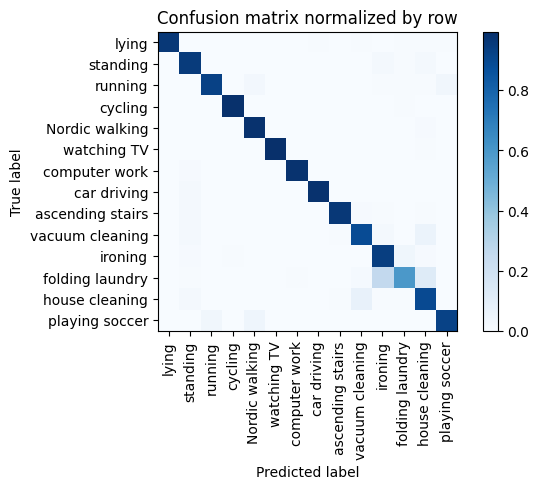

Training Epoch:  20%|██        | 3/15 [03:17<13:08, 65.71s/it]

Overall accuracy: 0.935

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.995      0.980      0.987      0.135        563|	 standing: 0.009,	house cleaning: 0.004,	
         ironing       0.862      0.938      0.898      0.117        485|	 folding laundry: 0.035,	house cleaning: 0.010,	
  Nordic walking       0.977      0.985      0.981      0.093        388|	 house cleaning: 0.010,	ironing: 0.003,	
        standing       0.916      0.951      0.933      0.088        366|	 house cleaning: 0.022,	ironing: 0.019,	
  house cleaning       0.821      0.895      0.856      0.085        353|	 vacuum cleaning: 0.071,	standing: 0.017,	
 vacuum cleaning       0.905      0.889      0.897      0.085        352|	 house cleaning: 0.060,	ironing: 0.023,	
           lying       1.000      0.963      0.981      0.084        350|	 playing soccer: 0.006,	house cleaning: 0.006,	
         cycling       0.987      0.990      0.988      0.07


train: 100%|██████████| 262/262 [00:59<00:00,  4.39batch/s, loss=3.42, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:06<00:00,  9.33batch/s, loss=3.45]


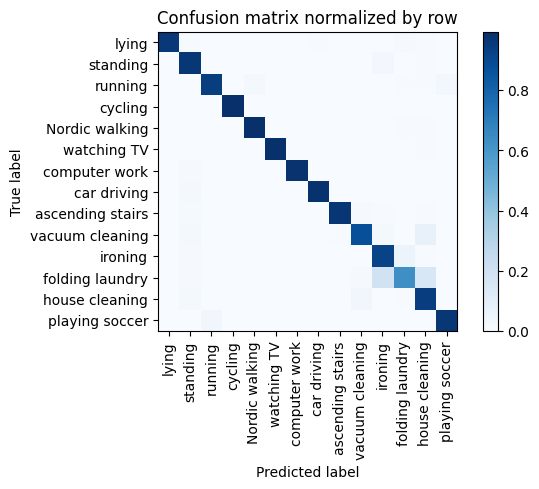

Training Epoch:  27%|██▋       | 4/15 [04:24<12:09, 66.30s/it]

Overall accuracy: 0.941

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.981      0.989      0.136        565|	 standing: 0.009,	house cleaning: 0.004,	
         ironing       0.883      0.921      0.901      0.118        491|	 folding laundry: 0.061,	standing: 0.010,	
  Nordic walking       0.989      0.987      0.988      0.092        381|	 house cleaning: 0.005,	folding laundry: 0.005,	
        standing       0.917      0.967      0.941      0.088        365|	 ironing: 0.025,	house cleaning: 0.005,	
 vacuum cleaning       0.948      0.875      0.910      0.085        353|	 house cleaning: 0.076,	ironing: 0.020,	
  house cleaning       0.823      0.937      0.876      0.084        351|	 vacuum cleaning: 0.034,	standing: 0.017,	
           lying       1.000      0.963      0.981      0.084        349|	 folding laundry: 0.009,	house cleaning: 0.006,	
         cycling       0.997      0.993      0.995      0


train: 100%|██████████| 262/262 [01:01<00:00,  4.23batch/s, loss=3.36, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.18batch/s, loss=3.2]


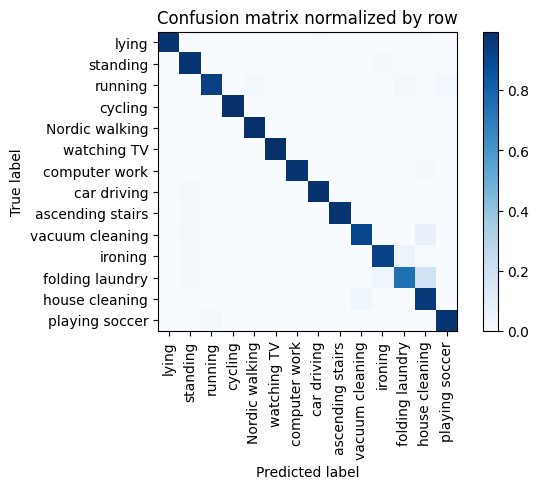

Training Epoch:  33%|███▎      | 5/15 [05:33<11:14, 67.49s/it]

Overall accuracy: 0.952

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.996      0.979      0.987      0.135        563|	 house cleaning: 0.011,	standing: 0.007,	
         ironing       0.960      0.924      0.942      0.118        490|	 folding laundry: 0.055,	standing: 0.012,	
  Nordic walking       0.990      0.990      0.990      0.093        387|	 house cleaning: 0.005,	folding laundry: 0.005,	
        standing       0.927      0.973      0.949      0.088        365|	 ironing: 0.014,	house cleaning: 0.005,	
  house cleaning       0.808      0.955      0.875      0.085        352|	 vacuum cleaning: 0.037,	standing: 0.006,	
 vacuum cleaning       0.952      0.903      0.927      0.085        352|	 house cleaning: 0.071,	standing: 0.017,	
           lying       1.000      0.971      0.985      0.084        349|	 house cleaning: 0.006,	folding laundry: 0.006,	
         cycling       1.000      0.993      0.997      


train: 100%|██████████| 262/262 [01:03<00:00,  4.13batch/s, loss=3.23, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.83batch/s, loss=3.38]


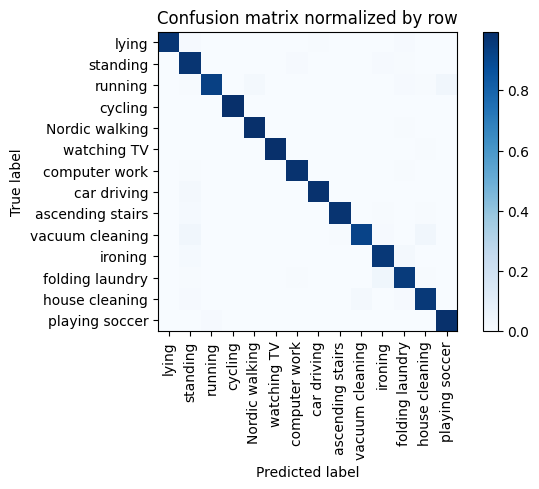

Training Epoch:  40%|████      | 6/15 [06:45<10:20, 68.90s/it]

Overall accuracy: 0.969

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.993      0.982      0.988      0.137        568|	 folding laundry: 0.007,	standing: 0.007,	
         ironing       0.965      0.961      0.963      0.118        490|	 folding laundry: 0.022,	standing: 0.012,	
  Nordic walking       0.992      0.995      0.993      0.092        384|	 folding laundry: 0.005,	playing soccer: 0.000,	
        standing       0.913      0.973      0.942      0.088        366|	 ironing: 0.011,	computer work: 0.008,	
  house cleaning       0.944      0.957      0.951      0.085        352|	 vacuum cleaning: 0.023,	folding laundry: 0.011,	
 vacuum cleaning       0.973      0.918      0.944      0.085        352|	 house cleaning: 0.034,	standing: 0.031,	
           lying       1.000      0.968      0.984      0.084        348|	 folding laundry: 0.011,	standing: 0.009,	
         cycling       1.000      0.993      0.997     


train: 100%|██████████| 262/262 [01:03<00:00,  4.16batch/s, loss=3.2, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.21batch/s, loss=3.58]


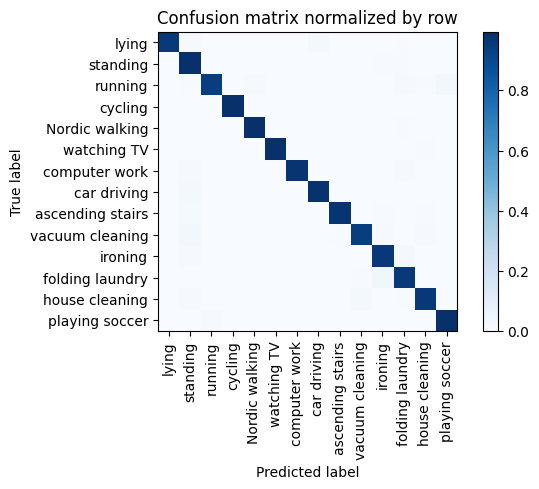

Training Epoch:  47%|████▋     | 7/15 [07:56<09:16, 69.51s/it]

Overall accuracy: 0.972

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.979      0.989      0.136        566|	 folding laundry: 0.009,	standing: 0.009,	
         ironing       0.969      0.963      0.966      0.118        489|	 folding laundry: 0.022,	standing: 0.010,	
  Nordic walking       0.995      0.995      0.995      0.093        386|	 folding laundry: 0.005,	playing soccer: 0.000,	
        standing       0.914      0.989      0.950      0.088        365|	 folding laundry: 0.005,	ironing: 0.005,	
  house cleaning       0.971      0.963      0.967      0.084        351|	 vacuum cleaning: 0.020,	standing: 0.011,	
 vacuum cleaning       0.974      0.943      0.958      0.084        351|	 standing: 0.028,	house cleaning: 0.011,	
           lying       1.000      0.954      0.976      0.084        348|	 car driving: 0.023,	standing: 0.011,	
         cycling       1.000      0.993      0.997      0.072   


train: 100%|██████████| 262/262 [01:03<00:00,  4.13batch/s, loss=3.17, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.69batch/s, loss=3.84]


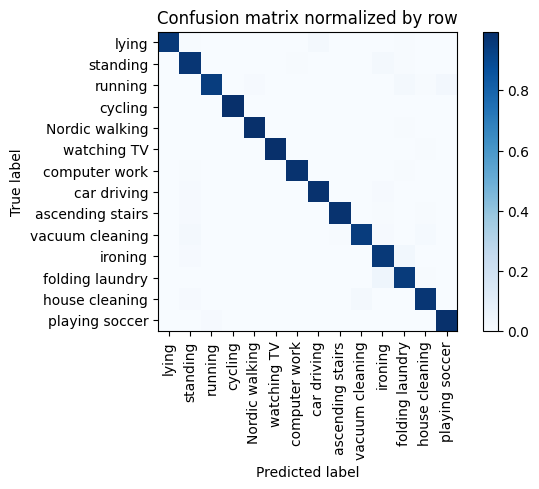

Training Epoch:  53%|█████▎    | 8/15 [09:08<08:11, 70.21s/it]

Overall accuracy: 0.971

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.996      0.981      0.988      0.136        567|	 standing: 0.007,	folding laundry: 0.005,	
         ironing       0.949      0.959      0.954      0.117        486|	 folding laundry: 0.031,	standing: 0.008,	
  Nordic walking       0.995      0.995      0.995      0.093        386|	 folding laundry: 0.005,	playing soccer: 0.000,	
        standing       0.939      0.970      0.954      0.087        363|	 ironing: 0.017,	folding laundry: 0.006,	
 vacuum cleaning       0.977      0.946      0.961      0.085        354|	 standing: 0.020,	house cleaning: 0.014,	
           lying       1.000      0.957      0.978      0.084        351|	 car driving: 0.023,	folding laundry: 0.006,	
  house cleaning       0.963      0.969      0.966      0.084        350|	 vacuum cleaning: 0.020,	standing: 0.009,	
         cycling       1.000      0.993      0.997      0


train: 100%|██████████| 262/262 [01:05<00:00,  4.03batch/s, loss=3.05, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.39batch/s, loss=3.61]


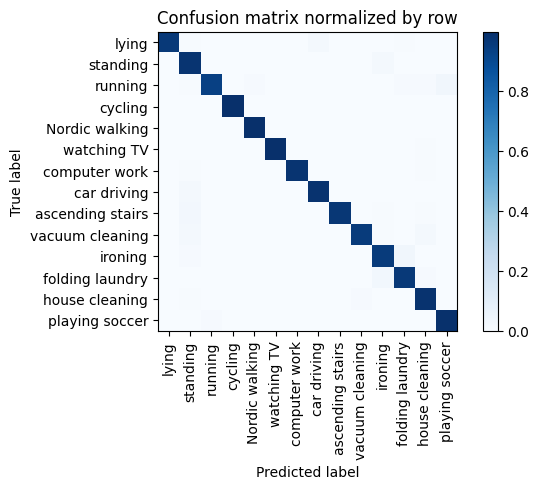

Training Epoch:  60%|██████    | 9/15 [10:21<07:07, 71.24s/it]

Overall accuracy: 0.972

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.981      0.990      0.137        568|	 standing: 0.007,	house cleaning: 0.005,	
         ironing       0.963      0.951      0.957      0.117        488|	 folding laundry: 0.035,	standing: 0.010,	
  Nordic walking       0.995      0.995      0.995      0.093        385|	 folding laundry: 0.003,	ironing: 0.003,	
        standing       0.925      0.978      0.951      0.088        365|	 ironing: 0.016,	house cleaning: 0.003,	
 vacuum cleaning       0.985      0.952      0.968      0.085        353|	 standing: 0.023,	house cleaning: 0.017,	
  house cleaning       0.950      0.983      0.966      0.084        350|	 vacuum cleaning: 0.011,	standing: 0.006,	
           lying       1.000      0.960      0.980      0.084        350|	 car driving: 0.023,	folding laundry: 0.006,	
         cycling       1.000      0.997      0.998      0.071     


train: 100%|██████████| 262/262 [01:03<00:00,  4.11batch/s, loss=2.83, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.52batch/s, loss=2.64]


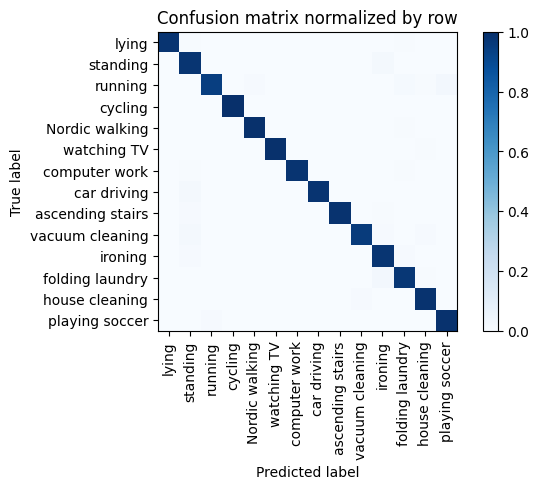

Training Epoch:  67%|██████▋   | 10/15 [11:33<05:57, 71.50s/it]

Overall accuracy: 0.980

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.981      0.990      0.136        567|	 folding laundry: 0.007,	standing: 0.007,	
         ironing       0.964      0.977      0.970      0.117        487|	 folding laundry: 0.010,	standing: 0.010,	
  Nordic walking       0.995      0.995      0.995      0.093        386|	 folding laundry: 0.005,	playing soccer: 0.000,	
        standing       0.937      0.978      0.957      0.088        366|	 ironing: 0.016,	house cleaning: 0.003,	
  house cleaning       0.975      0.986      0.980      0.085        352|	 vacuum cleaning: 0.011,	standing: 0.003,	
           lying       1.000      0.983      0.991      0.084        350|	 folding laundry: 0.006,	standing: 0.006,	
 vacuum cleaning       0.985      0.957      0.971      0.084        349|	 standing: 0.023,	ironing: 0.011,	
         cycling       1.000      1.000      1.000      0.072       


train: 100%|██████████| 262/262 [01:04<00:00,  4.06batch/s, loss=3.27, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.83batch/s, loss=2.69]


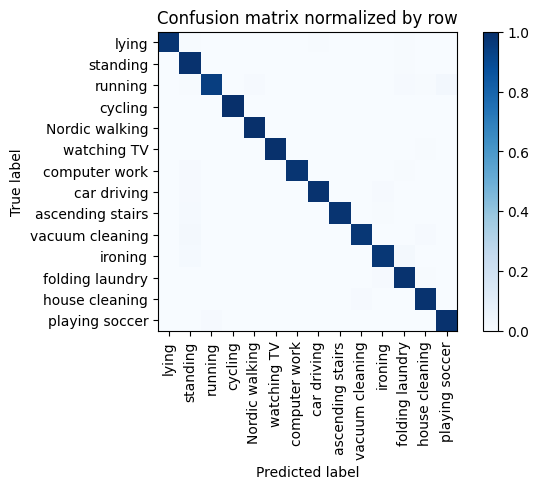

Training Epoch:  73%|███████▎  | 11/15 [12:46<04:47, 71.88s/it]

Overall accuracy: 0.982

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.980      0.990      0.135        563|	 standing: 0.011,	folding laundry: 0.007,	
         ironing       0.987      0.971      0.979      0.117        486|	 folding laundry: 0.016,	standing: 0.012,	
  Nordic walking       0.995      1.000      0.997      0.093        387|	 playing soccer: 0.000,	house cleaning: 0.000,	
        standing       0.931      0.989      0.959      0.088        366|	 folding laundry: 0.005,	house cleaning: 0.003,	
 vacuum cleaning       0.988      0.969      0.979      0.085        354|	 standing: 0.020,	house cleaning: 0.008,	
  house cleaning       0.975      0.986      0.980      0.085        353|	 vacuum cleaning: 0.011,	standing: 0.003,	
           lying       1.000      0.977      0.989      0.085        352|	 folding laundry: 0.006,	car driving: 0.006,	
         cycling       1.000      1.000      1.000 


train: 100%|██████████| 262/262 [01:04<00:00,  4.07batch/s, loss=3.09, accuracy=0.938]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  8.77batch/s, loss=3.21]


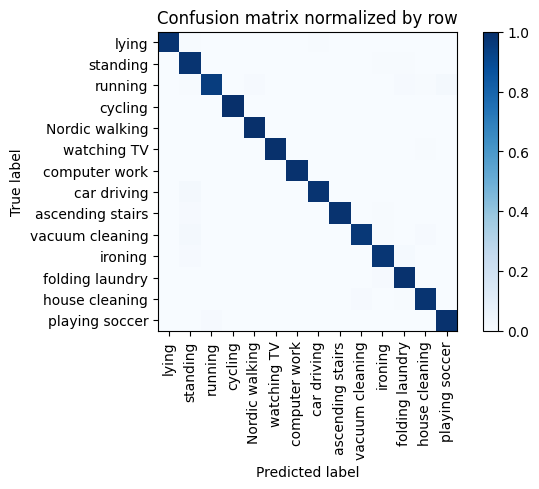

Training Epoch:  80%|████████  | 12/15 [13:58<03:36, 72.08s/it]

Overall accuracy: 0.984

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.989      0.994      0.136        567|	 ironing: 0.004,	standing: 0.004,	
         ironing       0.981      0.973      0.977      0.117        487|	 folding laundry: 0.014,	standing: 0.010,	
  Nordic walking       0.995      1.000      0.997      0.093        387|	 playing soccer: 0.000,	house cleaning: 0.000,	
        standing       0.942      0.983      0.962      0.087        362|	 folding laundry: 0.006,	ironing: 0.006,	
           lying       1.000      0.983      0.991      0.085        353|	 car driving: 0.006,	standing: 0.006,	
  house cleaning       0.980      0.983      0.982      0.085        352|	 vacuum cleaning: 0.009,	folding laundry: 0.006,	
 vacuum cleaning       0.988      0.966      0.977      0.084        351|	 standing: 0.020,	house cleaning: 0.009,	
         cycling       1.000      1.000      1.000      0.072     


train: 100%|██████████| 262/262 [01:03<00:00,  4.10batch/s, loss=3.75, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.12batch/s, loss=2.9]


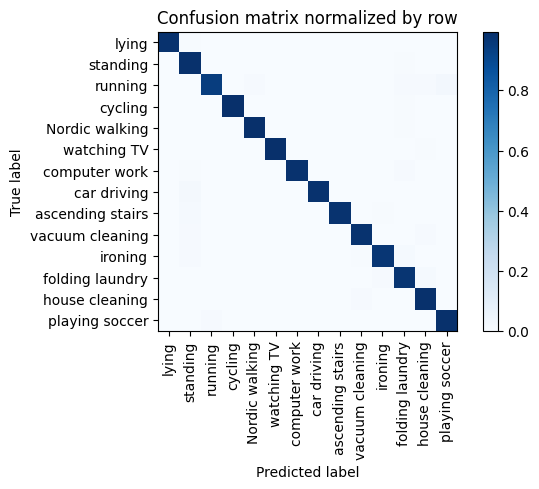

Training Epoch:  87%|████████▋ | 13/15 [15:10<02:23, 71.99s/it]

Overall accuracy: 0.983

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.984      0.992      0.136        565|	 folding laundry: 0.009,	standing: 0.005,	
         ironing       0.992      0.971      0.981      0.118        489|	 folding laundry: 0.012,	standing: 0.010,	
  Nordic walking       0.995      0.995      0.995      0.092        384|	 folding laundry: 0.005,	playing soccer: 0.000,	
        standing       0.950      0.989      0.969      0.087        364|	 folding laundry: 0.005,	house cleaning: 0.003,	
 vacuum cleaning       0.986      0.980      0.983      0.085        354|	 house cleaning: 0.011,	standing: 0.008,	
  house cleaning       0.961      0.989      0.975      0.085        353|	 vacuum cleaning: 0.008,	standing: 0.003,	
           lying       1.000      0.986      0.993      0.084        351|	 standing: 0.006,	house cleaning: 0.003,	
         cycling       1.000      0.993      0.997    


train: 100%|██████████| 262/262 [01:05<00:00,  4.00batch/s, loss=2.88, accuracy=1]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.00batch/s, loss=2.75]


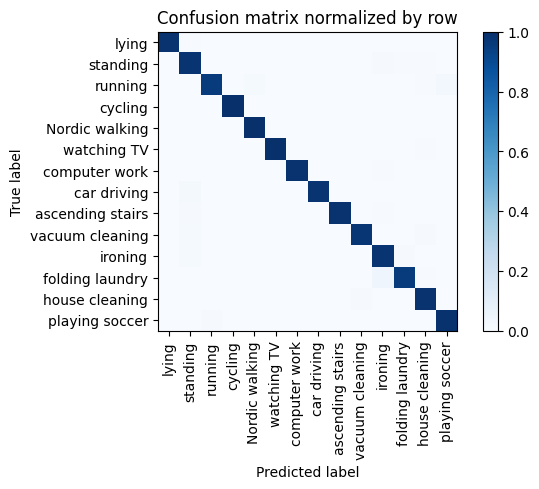

Training Epoch:  93%|█████████▎| 14/15 [16:24<01:12, 72.43s/it]

Overall accuracy: 0.983

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.988      0.994      0.137        568|	 ironing: 0.005,	standing: 0.004,	
         ironing       0.965      0.977      0.971      0.117        485|	 standing: 0.012,	folding laundry: 0.008,	
  Nordic walking       0.992      1.000      0.996      0.093        388|	 playing soccer: 0.000,	house cleaning: 0.000,	
        standing       0.947      0.978      0.962      0.087        364|	 ironing: 0.011,	house cleaning: 0.005,	
 vacuum cleaning       0.986      0.975      0.980      0.085        353|	 standing: 0.014,	house cleaning: 0.008,	
  house cleaning       0.972      0.986      0.979      0.084        350|	 vacuum cleaning: 0.011,	standing: 0.003,	
           lying       1.000      0.986      0.993      0.084        350|	 standing: 0.006,	house cleaning: 0.003,	
         cycling       1.000      1.000      1.000      0.072        29


train: 100%|██████████| 262/262 [01:07<00:00,  3.87batch/s, loss=4.31, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 65/65 [00:07<00:00,  9.04batch/s, loss=3.03]


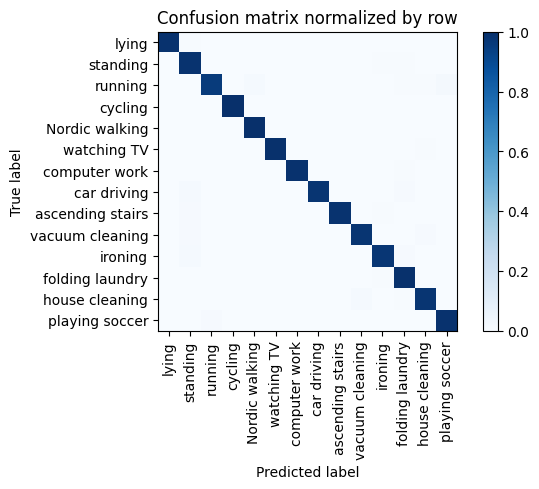

Overall accuracy: 0.986

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       1.000      0.991      0.996      0.137        568|	 folding laundry: 0.005,	house cleaning: 0.002,	
         ironing       0.990      0.976      0.983      0.118        490|	 standing: 0.012,	folding laundry: 0.010,	
  Nordic walking       0.992      1.000      0.996      0.093        386|	 playing soccer: 0.000,	house cleaning: 0.000,	
        standing       0.955      0.986      0.970      0.087        362|	 folding laundry: 0.006,	ironing: 0.006,	
 vacuum cleaning       0.983      0.977      0.980      0.085        353|	 house cleaning: 0.011,	standing: 0.008,	
  house cleaning       0.977      0.977      0.977      0.084        351|	 vacuum cleaning: 0.014,	folding laundry: 0.006,	
           lying       1.000      0.989      0.994      0.084        351|	 standing: 0.006,	folding laundry: 0.003,	
         cycling       1.000      1.000      1.0

unseen: 100%|██████████| 86/86 [00:08<00:00,  9.94batch/s, loss=4.31]


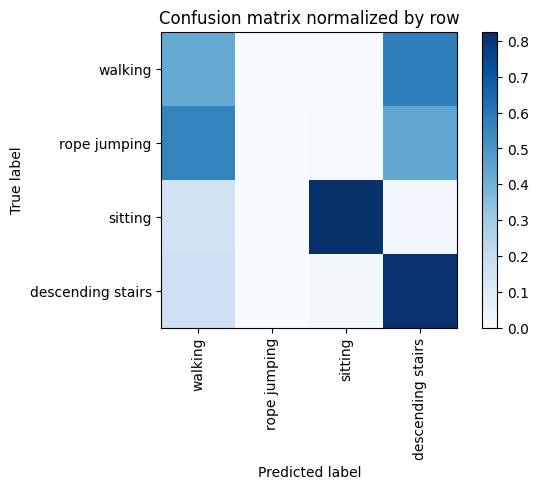

Overall accuracy: 0.587

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.587      0.425      0.493      0.421       2318|	 descending stairs: 0.573,	sitting: 0.002,	
          sitting       0.987      0.826      0.899      0.325       1790|	 walking: 0.155,	descending stairs: 0.020,	
descending stairs       0.329      0.817      0.469      0.170        938|	 walking: 0.170,	sitting: 0.014,	
     rope jumping       0.000      0.000      0.000      0.083        458|	 walking: 0.559,	descending stairs: 0.437,	sitting: 0.004,	

----------------------------------------------------------------------------------------------------
      avg / total       0.624      0.587      0.580        1.0       5504|	      

{'accuracy': 0.5866642441860465, 'precision': 0.4757259413305213, 'recall': 0.5168161857821475, 'f1': 0.4652687252859125}
================ Fold-2 ================
Unseen Classes : ['playing soccer', 'lying', 'vacuum

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 15, 17]
unseen classes >  [16, 0, 12, 8]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 2048])



train: 100%|██████████| 242/242 [00:54<00:00,  4.44batch/s, loss=4.78, accuracy=0.812]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.48batch/s, loss=4.26]


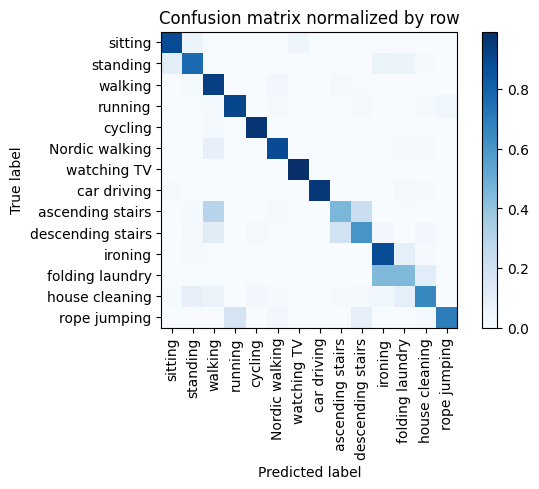

Training Epoch:   7%|▋         | 1/15 [01:01<14:20, 61.49s/it]

Overall accuracy: 0.805

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.759      0.932      0.836      0.134        513|	 Nordic walking: 0.023,	ascending stairs: 0.021,	
          ironing       0.747      0.882      0.809      0.120        459|	 folding laundry: 0.087,	standing: 0.013,	
   house cleaning       0.833      0.659      0.736      0.096        370|	 folding laundry: 0.086,	standing: 0.078,	
   Nordic walking       0.932      0.886      0.908      0.096        369|	 walking: 0.081,	house cleaning: 0.014,	
          sitting       0.882      0.887      0.885      0.088        337|	 standing: 0.059,	watching TV: 0.045,	
         standing       0.781      0.766      0.774      0.084        321|	 sitting: 0.103,	ironing: 0.059,	
          cycling       0.954      0.969      0.961      0.083        319|	 walking: 0.022,	house cleaning: 0.003,	
 ascending stairs       0.662      0.455      0.540      0.058    


train: 100%|██████████| 242/242 [01:03<00:00,  3.83batch/s, loss=4.14, accuracy=0.844]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.84batch/s, loss=4.2]


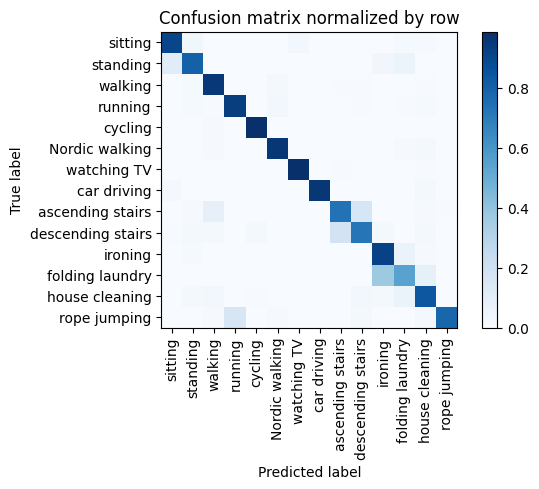

Training Epoch:  13%|█▎        | 2/15 [02:12<14:32, 67.10s/it]

Overall accuracy: 0.874

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.927      0.954      0.940      0.135        517|	 Nordic walking: 0.015,	standing: 0.014,	
          ironing       0.808      0.916      0.858      0.121        463|	 folding laundry: 0.063,	standing: 0.013,	
   house cleaning       0.864      0.839      0.851      0.097        372|	 folding laundry: 0.062,	descending stairs: 0.030,	
   Nordic walking       0.965      0.959      0.962      0.096        370|	 house cleaning: 0.019,	folding laundry: 0.008,	
          sitting       0.886      0.905      0.895      0.087        336|	 standing: 0.036,	watching TV: 0.030,	
         standing       0.865      0.801      0.832      0.084        321|	 sitting: 0.112,	folding laundry: 0.053,	
          cycling       0.981      0.984      0.982      0.082        313|	 walking: 0.010,	ironing: 0.003,	
 ascending stairs       0.813      0.737      0.773     


train: 100%|██████████| 242/242 [00:57<00:00,  4.24batch/s, loss=3.91, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.74batch/s, loss=3.27]


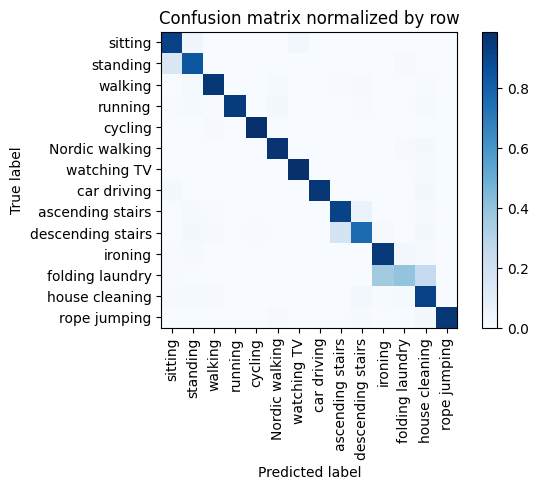

Training Epoch:  20%|██        | 3/15 [03:16<13:07, 65.60s/it]

Overall accuracy: 0.900

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.980      0.957      0.969      0.135        517|	 Nordic walking: 0.014,	standing: 0.012,	
          ironing       0.838      0.950      0.890      0.119        458|	 folding laundry: 0.024,	standing: 0.011,	
   house cleaning       0.805      0.919      0.858      0.097        372|	 descending stairs: 0.027,	folding laundry: 0.013,	
   Nordic walking       0.970      0.968      0.969      0.097        371|	 house cleaning: 0.022,	folding laundry: 0.008,	
          sitting       0.843      0.920      0.880      0.088        338|	 standing: 0.044,	watching TV: 0.030,	
         standing       0.876      0.838      0.856      0.083        320|	 sitting: 0.147,	folding laundry: 0.009,	
          cycling       0.997      0.987      0.992      0.082        316|	 walking: 0.009,	ironing: 0.003,	
 ascending stairs       0.852      0.914      0.882     


train: 100%|██████████| 242/242 [00:56<00:00,  4.30batch/s, loss=3.96, accuracy=0.859]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.30batch/s, loss=3.42]


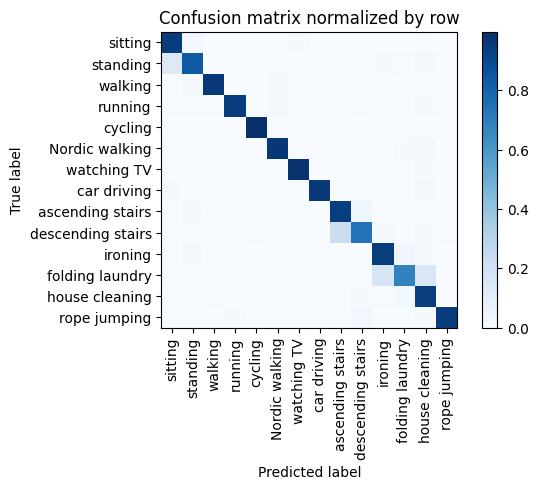

Training Epoch:  27%|██▋       | 4/15 [04:19<11:52, 64.81s/it]

Overall accuracy: 0.922

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.990      0.965      0.977      0.134        513|	 Nordic walking: 0.018,	standing: 0.012,	
          ironing       0.904      0.945      0.924      0.119        457|	 folding laundry: 0.035,	standing: 0.011,	
   house cleaning       0.842      0.946      0.891      0.097        371|	 folding laundry: 0.030,	descending stairs: 0.011,	
   Nordic walking       0.968      0.968      0.968      0.096        370|	 house cleaning: 0.019,	folding laundry: 0.008,	
          sitting       0.877      0.950      0.912      0.088        337|	 standing: 0.027,	watching TV: 0.012,	
         standing       0.917      0.831      0.872      0.083        320|	 sitting: 0.131,	house cleaning: 0.022,	
          cycling       0.994      0.997      0.995      0.083        318|	 walking: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.833      0.946      0.886 


train: 100%|██████████| 242/242 [01:03<00:00,  3.82batch/s, loss=4.56, accuracy=0.922]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.40batch/s, loss=3.13]


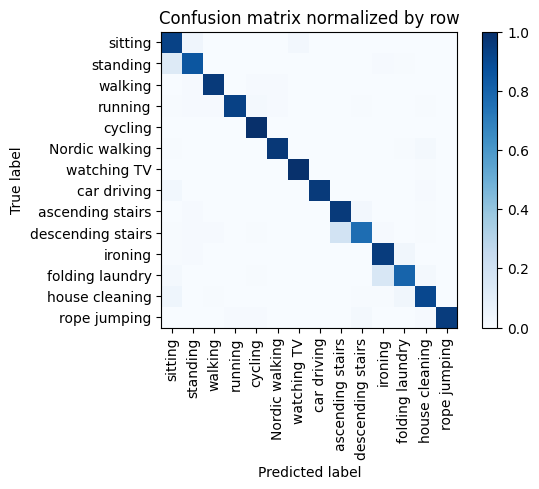

Training Epoch:  33%|███▎      | 5/15 [05:31<11:11, 67.17s/it]

Overall accuracy: 0.927

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.986      0.957      0.971      0.134        514|	 standing: 0.012,	Nordic walking: 0.010,	
          ironing       0.911      0.949      0.930      0.118        454|	 folding laundry: 0.033,	standing: 0.011,	
   house cleaning       0.949      0.908      0.928      0.096        368|	 sitting: 0.043,	folding laundry: 0.033,	
   Nordic walking       0.981      0.967      0.974      0.096        368|	 house cleaning: 0.016,	folding laundry: 0.005,	
          sitting       0.814      0.926      0.867      0.089        340|	 standing: 0.041,	watching TV: 0.026,	
         standing       0.899      0.855      0.877      0.084        324|	 sitting: 0.127,	ironing: 0.009,	
          cycling       0.964      1.000      0.981      0.083        317|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.859      0.959      0.906      0.058


train: 100%|██████████| 242/242 [00:59<00:00,  4.07batch/s, loss=3.44, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  7.62batch/s, loss=3.22]


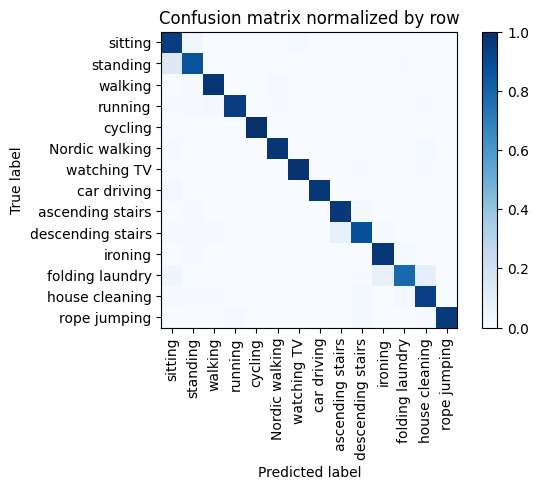

Training Epoch:  40%|████      | 6/15 [06:39<10:07, 67.51s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.982      0.973      0.978      0.134        514|	 standing: 0.012,	Nordic walking: 0.010,	
          ironing       0.955      0.972      0.964      0.121        463|	 folding laundry: 0.015,	standing: 0.011,	
   Nordic walking       0.984      0.973      0.978      0.097        371|	 house cleaning: 0.013,	sitting: 0.008,	
   house cleaning       0.920      0.937      0.928      0.095        366|	 folding laundry: 0.022,	descending stairs: 0.016,	
          sitting       0.832      0.944      0.885      0.088        337|	 standing: 0.039,	watching TV: 0.012,	
         standing       0.894      0.866      0.880      0.084        321|	 sitting: 0.128,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.934      0.968      0.951 


train: 100%|██████████| 242/242 [00:58<00:00,  4.16batch/s, loss=3.55, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.22batch/s, loss=3.11]


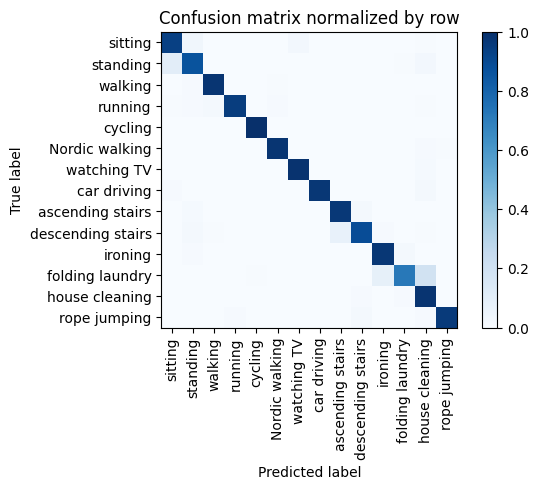

Training Epoch:  47%|████▋     | 7/15 [07:44<08:54, 66.80s/it]

Overall accuracy: 0.945

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.977      0.984      0.134        514|	 standing: 0.012,	Nordic walking: 0.006,	
          ironing       0.955      0.969      0.962      0.120        459|	 folding laundry: 0.017,	standing: 0.011,	
   house cleaning       0.847      0.984      0.910      0.096        370|	 folding laundry: 0.008,	descending stairs: 0.008,	
   Nordic walking       0.986      0.978      0.982      0.095        365|	 house cleaning: 0.011,	rope jumping: 0.005,	
          sitting       0.898      0.935      0.916      0.089        340|	 standing: 0.032,	watching TV: 0.026,	
          cycling       0.997      1.000      0.998      0.083        320|	 rope jumping: 0.000,	house cleaning: 0.000,	
         standing       0.902      0.865      0.883      0.083        319|	 sitting: 0.103,	house cleaning: 0.025,	
 ascending stairs       0.939      0.968      0.


train: 100%|██████████| 242/242 [01:02<00:00,  3.90batch/s, loss=3.46, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.41batch/s, loss=3.35]


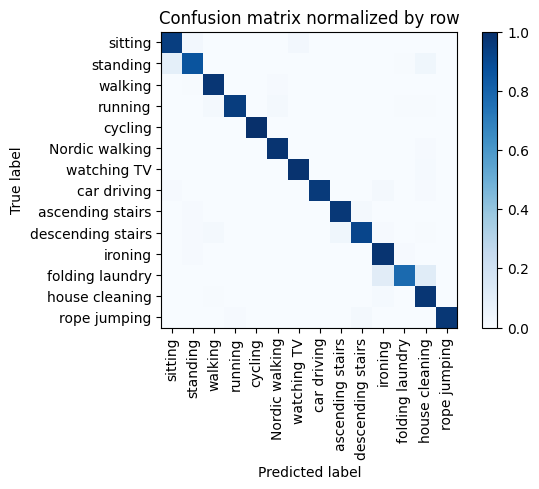

Training Epoch:  53%|█████▎    | 8/15 [08:53<07:52, 67.54s/it]

Overall accuracy: 0.951

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.982      0.975      0.979      0.134        515|	 Nordic walking: 0.012,	standing: 0.008,	
          ironing       0.928      0.982      0.954      0.119        456|	 folding laundry: 0.009,	standing: 0.009,	
   house cleaning       0.890      0.976      0.931      0.097        372|	 ironing: 0.013,	walking: 0.005,	
   Nordic walking       0.976      0.981      0.978      0.096        369|	 house cleaning: 0.008,	rope jumping: 0.003,	
          sitting       0.908      0.943      0.925      0.087        335|	 watching TV: 0.027,	standing: 0.024,	
         standing       0.933      0.861      0.896      0.084        324|	 sitting: 0.093,	house cleaning: 0.037,	
          cycling       0.997      1.000      0.998      0.083        317|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.969      0.969      0.969      0.058    


train: 100%|██████████| 242/242 [01:00<00:00,  3.99batch/s, loss=3.22, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.15batch/s, loss=2.42]


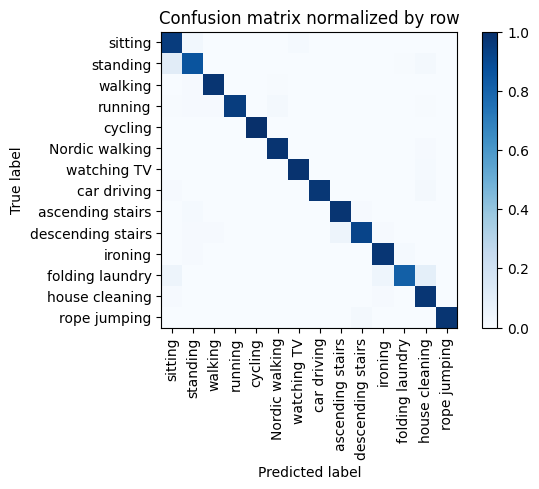

Training Epoch:  60%|██████    | 9/15 [10:02<06:47, 68.00s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.977      0.982      0.134        513|	 standing: 0.012,	Nordic walking: 0.006,	
          ironing       0.963      0.976      0.970      0.119        458|	 folding laundry: 0.013,	standing: 0.011,	
   house cleaning       0.909      0.973      0.940      0.096        370|	 ironing: 0.011,	sitting: 0.008,	
   Nordic walking       0.984      0.984      0.984      0.096        370|	 house cleaning: 0.008,	rope jumping: 0.003,	
          sitting       0.863      0.953      0.906      0.088        338|	 standing: 0.030,	watching TV: 0.012,	
          cycling       0.997      1.000      0.998      0.083        319|	 rope jumping: 0.000,	house cleaning: 0.000,	
         standing       0.905      0.862      0.883      0.083        319|	 sitting: 0.110,	house cleaning: 0.022,	
 ascending stairs       0.960      0.977      0.969      0.058    


train: 100%|██████████| 242/242 [01:05<00:00,  3.70batch/s, loss=3.47, accuracy=0.906]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  8.85batch/s, loss=2.7]


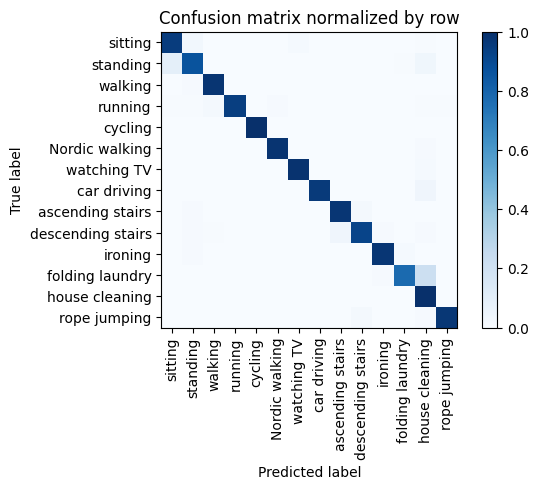

Training Epoch:  67%|██████▋   | 10/15 [11:15<05:47, 69.48s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.979      0.983      0.134        514|	 standing: 0.012,	house cleaning: 0.004,	
          ironing       0.989      0.974      0.981      0.120        460|	 folding laundry: 0.015,	standing: 0.011,	
   house cleaning       0.827      0.997      0.904      0.096        370|	 walking: 0.003,	rope jumping: 0.000,	
   Nordic walking       0.989      0.984      0.986      0.096        368|	 house cleaning: 0.011,	rope jumping: 0.003,	
          sitting       0.915      0.953      0.934      0.089        341|	 standing: 0.029,	watching TV: 0.012,	
         standing       0.914      0.866      0.889      0.083        320|	 sitting: 0.091,	house cleaning: 0.037,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.964      0.973      0.968      0.05


train: 100%|██████████| 242/242 [00:58<00:00,  4.17batch/s, loss=3.39, accuracy=0.953]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.25batch/s, loss=2.92]


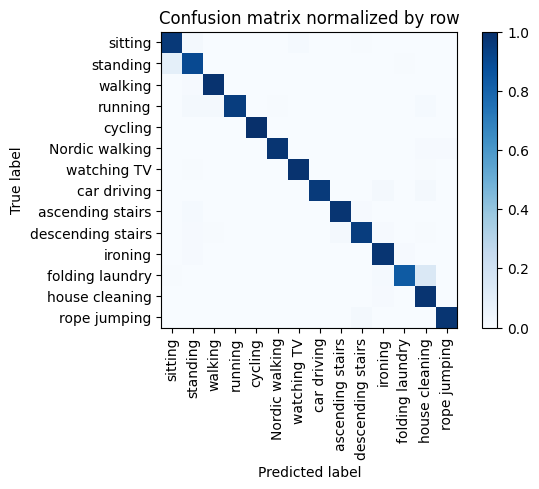

Training Epoch:  73%|███████▎  | 11/15 [12:20<04:32, 68.18s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.986      0.987      0.134        514|	 standing: 0.010,	folding laundry: 0.004,	
          ironing       0.974      0.980      0.977      0.119        458|	 standing: 0.011,	folding laundry: 0.009,	
   house cleaning       0.899      0.984      0.940      0.097        371|	 ironing: 0.011,	walking: 0.003,	
   Nordic walking       0.997      0.978      0.988      0.096        370|	 rope jumping: 0.008,	house cleaning: 0.008,	
          sitting       0.910      0.962      0.935      0.088        338|	 standing: 0.021,	watching TV: 0.012,	
         standing       0.917      0.900      0.909      0.084        321|	 sitting: 0.093,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.982      0.977      0.980      0.058  


train: 100%|██████████| 242/242 [01:00<00:00,  4.00batch/s, loss=3.14, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:07<00:00,  8.55batch/s, loss=2.97]


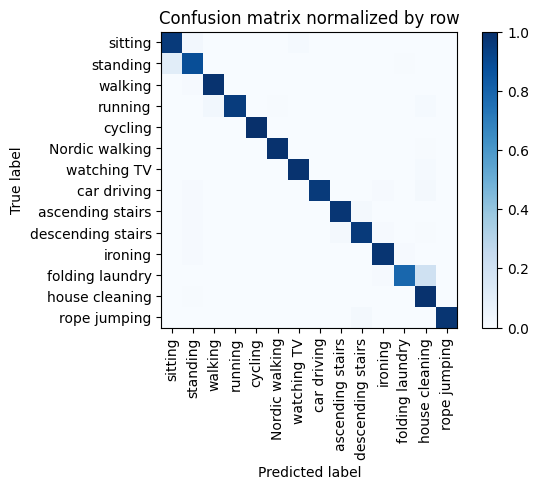

Training Epoch:  80%|████████  | 12/15 [13:29<03:24, 68.27s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.986      0.985      0.985      0.135        517|	 standing: 0.010,	house cleaning: 0.004,	
          ironing       0.987      0.978      0.983      0.120        461|	 folding laundry: 0.011,	standing: 0.011,	
   house cleaning       0.865      0.989      0.923      0.096        370|	 standing: 0.005,	ironing: 0.003,	
   Nordic walking       0.995      0.992      0.993      0.095        366|	 house cleaning: 0.005,	walking: 0.003,	
          sitting       0.905      0.958      0.931      0.088        337|	 standing: 0.024,	watching TV: 0.012,	
         standing       0.919      0.884      0.901      0.083        320|	 sitting: 0.106,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.986      0.973      0.980      0.058       


train: 100%|██████████| 242/242 [01:07<00:00,  3.59batch/s, loss=3.27, accuracy=0.984]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.02batch/s, loss=3.66]


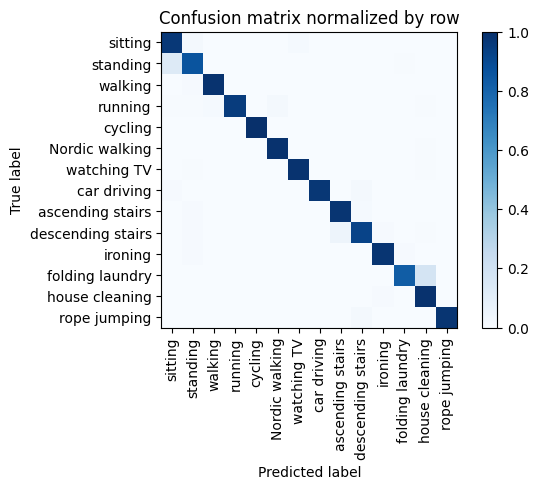

Training Epoch:  87%|████████▋ | 13/15 [14:44<02:20, 70.23s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.992      0.985      0.988      0.135        517|	 standing: 0.012,	house cleaning: 0.002,	
          ironing       0.989      0.980      0.985      0.119        458|	 standing: 0.011,	folding laundry: 0.009,	
   house cleaning       0.890      0.989      0.937      0.096        368|	 ironing: 0.008,	walking: 0.003,	
   Nordic walking       0.992      0.992      0.992      0.096        367|	 house cleaning: 0.005,	walking: 0.003,	
          sitting       0.878      0.967      0.921      0.087        336|	 standing: 0.018,	watching TV: 0.012,	
         standing       0.924      0.861      0.891      0.084        324|	 sitting: 0.133,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.083        318|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.960      0.978      0.969      0.058        


train: 100%|██████████| 242/242 [00:57<00:00,  4.18batch/s, loss=3.08, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:06<00:00,  9.11batch/s, loss=2.93]


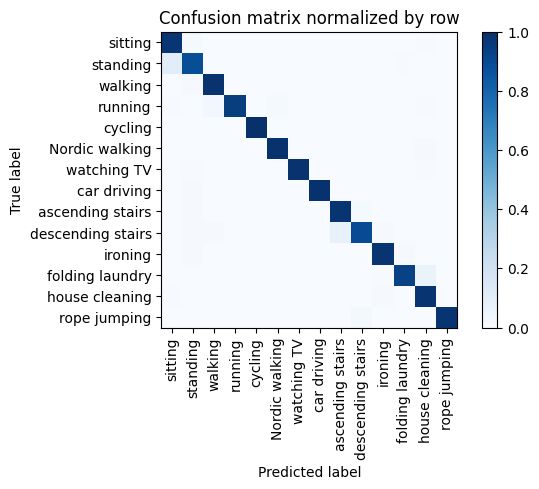

Training Epoch:  93%|█████████▎| 14/15 [15:49<01:08, 68.81s/it]

Overall accuracy: 0.967

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.983      0.986      0.984      0.134        513|	 standing: 0.010,	house cleaning: 0.002,	
          ironing       0.987      0.980      0.984      0.120        460|	 standing: 0.011,	folding laundry: 0.009,	
   house cleaning       0.941      0.981      0.961      0.097        373|	 ironing: 0.008,	sitting: 0.005,	
   Nordic walking       0.995      0.989      0.992      0.096        369|	 house cleaning: 0.008,	walking: 0.003,	
          sitting       0.898      0.976      0.936      0.087        335|	 standing: 0.015,	house cleaning: 0.006,	
         standing       0.931      0.885      0.907      0.084        321|	 sitting: 0.106,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.083        319|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.939      0.977      0.958      0.058     


train: 100%|██████████| 242/242 [01:00<00:00,  4.01batch/s, loss=3.59, accuracy=0.969]


torch.Size([14, 2048])



seen: 100%|██████████| 60/60 [00:08<00:00,  7.45batch/s, loss=2.52]


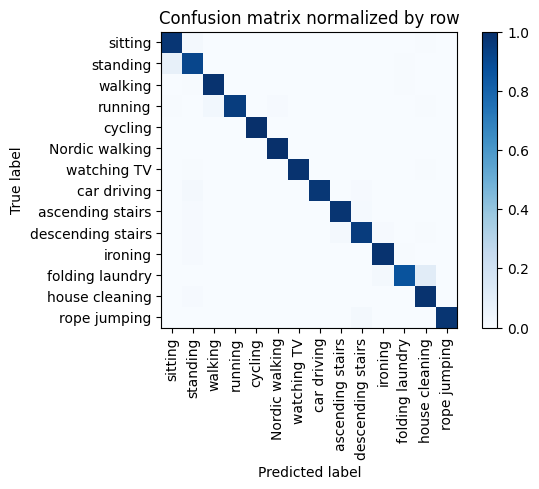

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.988      0.988      0.988      0.132        508|	 standing: 0.006,	folding laundry: 0.004,	
          ironing       0.983      0.985      0.984      0.121        463|	 standing: 0.011,	folding laundry: 0.004,	
   house cleaning       0.924      0.986      0.954      0.096        370|	 standing: 0.008,	ironing: 0.003,	
   Nordic walking       0.992      0.997      0.995      0.096        368|	 house cleaning: 0.003,	rope jumping: 0.000,	
          sitting       0.924      0.973      0.948      0.087        336|	 standing: 0.021,	house cleaning: 0.006,	
         standing       0.921      0.913      0.917      0.084        321|	 sitting: 0.081,	folding laundry: 0.006,	
          cycling       1.000      1.000      1.000      0.083        320|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.982      0.977      0.979      0.0

unseen: 100%|██████████| 111/111 [00:13<00:00,  8.30batch/s, loss=4.52]


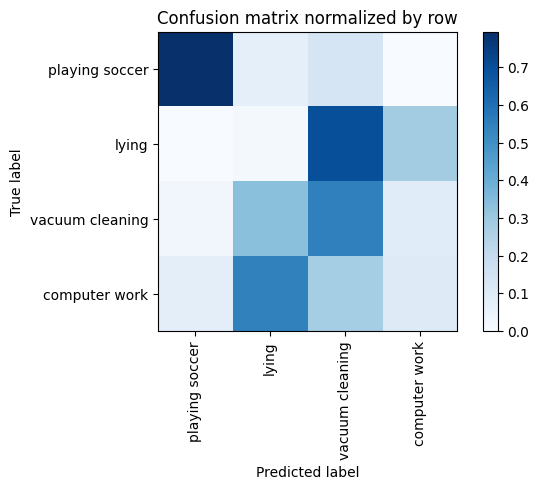

Overall accuracy: 0.229

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.305      0.098      0.149      0.432       3068|	 lying: 0.545,	vacuum cleaning: 0.281,	
          lying       0.013      0.016      0.014      0.264       1874|	 vacuum cleaning: 0.699,	computer work: 0.283,	
vacuum cleaning       0.294      0.546      0.383      0.240       1706|	 lying: 0.335,	computer work: 0.093,	
 playing soccer       0.565      0.794      0.660      0.064        456|	 vacuum cleaning: 0.134,	lying: 0.072,	

----------------------------------------------------------------------------------------------------
    avg / total       0.242      0.229      0.202        1.0       7104|	      

{'accuracy': 0.22888513513513514, 'precision': 0.29429368991604477, 'recall': 0.36365270027071805, 'f1': 0.3014421533358642}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking']
per class count :  

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
unseen classes >  [5, 4, 6]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 276/276 [01:03<00:00,  4.34batch/s, loss=4.75, accuracy=0.703]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.25batch/s, loss=4.35]


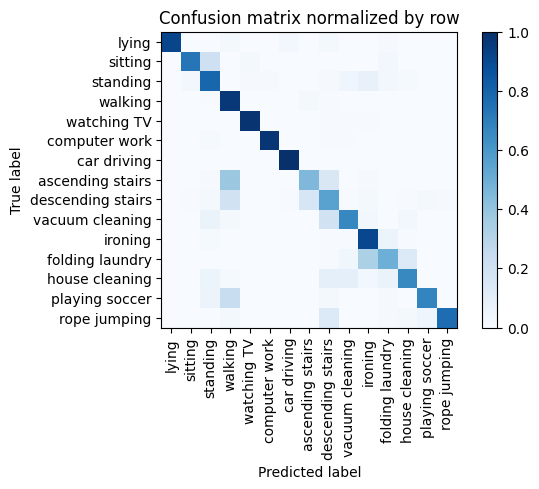

Training Epoch:   7%|▋         | 1/15 [01:11<16:47, 71.97s/it]

Overall accuracy: 0.803

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.976      0.982      0.140        618|	 standing: 0.013,	vacuum cleaning: 0.005,	
          ironing       0.794      0.909      0.847      0.114        504|	 folding laundry: 0.062,	standing: 0.014,	
          walking       0.743      0.965      0.840      0.104        459|	 ascending stairs: 0.022,	descending stairs: 0.007,	
         standing       0.674      0.790      0.728      0.085        377|	 ironing: 0.072,	vacuum cleaning: 0.040,	
   house cleaning       0.837      0.658      0.737      0.083        368|	 descending stairs: 0.092,	vacuum cleaning: 0.090,	
            lying       1.000      0.918      0.957      0.083        365|	 car driving: 0.030,	descending stairs: 0.019,	
          sitting       0.960      0.732      0.831      0.082        362|	 standing: 0.207,	folding laundry: 0.030,	
  vacuum cleaning       0.790    


train: 100%|██████████| 276/276 [01:03<00:00,  4.32batch/s, loss=4.23, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 10.30batch/s, loss=3.14]


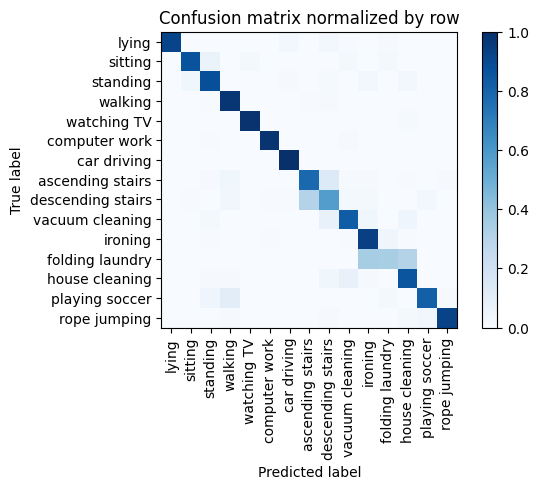

Training Epoch:  13%|█▎        | 2/15 [02:23<15:29, 71.53s/it]

Overall accuracy: 0.872

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.984      0.987      0.139        616|	 vacuum cleaning: 0.008,	standing: 0.005,	
          ironing       0.823      0.934      0.875      0.114        503|	 folding laundry: 0.044,	house cleaning: 0.006,	
          walking       0.943      0.976      0.959      0.103        457|	 descending stairs: 0.011,	ascending stairs: 0.007,	
         standing       0.873      0.880      0.877      0.085        376|	 sitting: 0.037,	ironing: 0.027,	
   house cleaning       0.773      0.859      0.813      0.083        368|	 vacuum cleaning: 0.076,	descending stairs: 0.035,	
          sitting       0.955      0.867      0.909      0.083        368|	 standing: 0.065,	folding laundry: 0.022,	
            lying       1.000      0.921      0.959      0.083        366|	 car driving: 0.030,	descending stairs: 0.025,	
  vacuum cleaning       0.847      


train: 100%|██████████| 276/276 [01:05<00:00,  4.23batch/s, loss=3.79, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.31batch/s, loss=2.89]


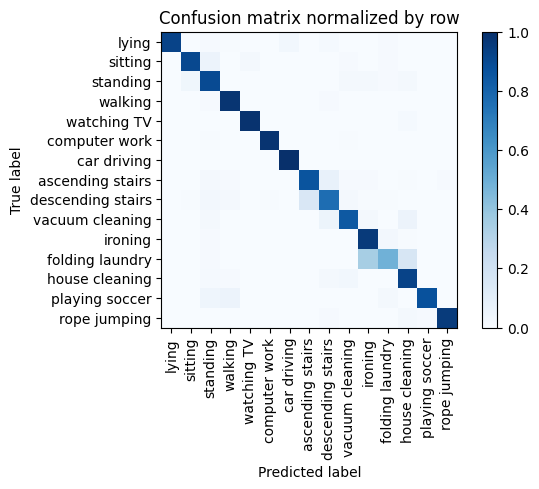

Training Epoch:  20%|██        | 3/15 [03:36<14:28, 72.34s/it]

Overall accuracy: 0.906

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.984      0.989      0.140        618|	 vacuum cleaning: 0.006,	standing: 0.006,	
          ironing       0.849      0.960      0.901      0.114        503|	 folding laundry: 0.024,	standing: 0.010,	
          walking       0.966      0.980      0.973      0.103        457|	 descending stairs: 0.009,	standing: 0.009,	
         standing       0.839      0.897      0.867      0.085        377|	 sitting: 0.037,	house cleaning: 0.019,	
   house cleaning       0.829      0.924      0.874      0.083        367|	 vacuum cleaning: 0.030,	descending stairs: 0.022,	
            lying       1.000      0.924      0.960      0.083        367|	 car driving: 0.030,	descending stairs: 0.014,	
          sitting       0.954      0.904      0.928      0.082        364|	 standing: 0.055,	watching TV: 0.016,	
  vacuum cleaning       0.907      0.842      


train: 100%|██████████| 276/276 [01:08<00:00,  4.04batch/s, loss=3.69, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.16batch/s, loss=4.05]


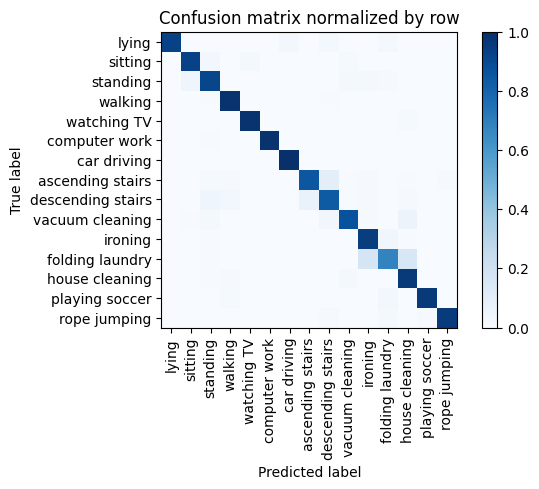

Training Epoch:  27%|██▋       | 4/15 [04:53<13:34, 74.03s/it]

Overall accuracy: 0.928

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.985      0.990      0.139        615|	 standing: 0.007,	vacuum cleaning: 0.003,	
          ironing       0.905      0.948      0.926      0.114        504|	 folding laundry: 0.038,	standing: 0.006,	
          walking       0.976      0.987      0.982      0.104        458|	 descending stairs: 0.007,	standing: 0.004,	
         standing       0.893      0.912      0.903      0.085        376|	 sitting: 0.040,	ironing: 0.021,	
   house cleaning       0.849      0.959      0.901      0.083        368|	 vacuum cleaning: 0.019,	walking: 0.008,	
          sitting       0.953      0.932      0.942      0.083        366|	 standing: 0.030,	watching TV: 0.022,	
            lying       1.000      0.926      0.962      0.083        365|	 car driving: 0.030,	descending stairs: 0.022,	
  vacuum cleaning       0.932      0.872      0.901      0.082 


train: 100%|██████████| 276/276 [01:10<00:00,  3.93batch/s, loss=3.91, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  7.95batch/s, loss=3.81]


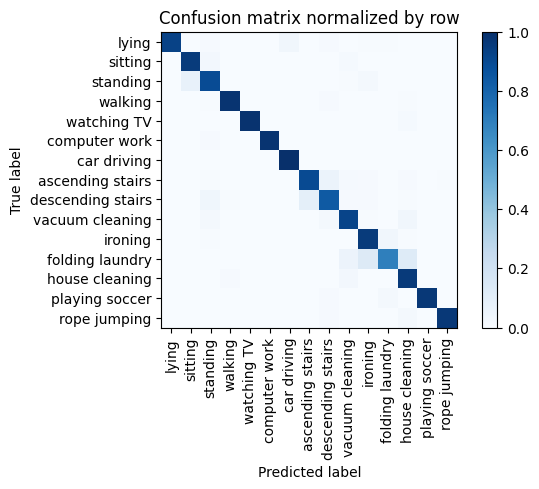

Training Epoch:  33%|███▎      | 5/15 [06:12<12:40, 76.06s/it]

Overall accuracy: 0.935

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.984      0.992      0.139        616|	 standing: 0.010,	vacuum cleaning: 0.003,	
          ironing       0.921      0.954      0.937      0.114        502|	 folding laundry: 0.034,	standing: 0.006,	
          walking       0.991      0.983      0.987      0.104        459|	 descending stairs: 0.009,	house cleaning: 0.004,	
         standing       0.892      0.894      0.893      0.085        377|	 sitting: 0.077,	ironing: 0.019,	
   house cleaning       0.874      0.959      0.915      0.083        368|	 vacuum cleaning: 0.024,	walking: 0.008,	
          sitting       0.921      0.954      0.937      0.083        367|	 standing: 0.027,	vacuum cleaning: 0.014,	
            lying       1.000      0.929      0.963      0.082        364|	 car driving: 0.033,	standing: 0.011,	
  vacuum cleaning       0.902      0.919      0.911      0.082


train: 100%|██████████| 276/276 [01:14<00:00,  3.71batch/s, loss=3.31, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.00batch/s, loss=3.01]


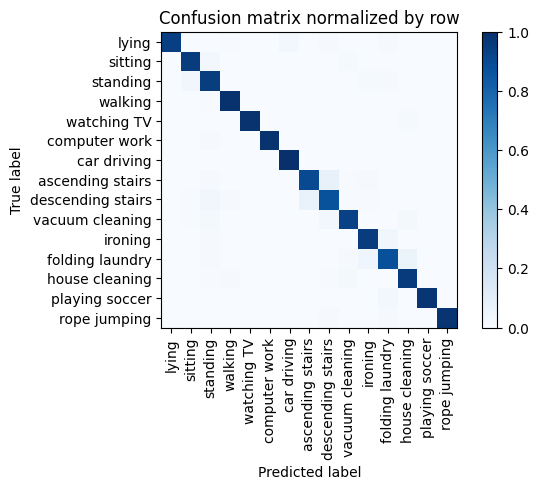

Training Epoch:  40%|████      | 6/15 [07:35<11:45, 78.34s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.985      0.993      0.140        617|	 standing: 0.008,	vacuum cleaning: 0.003,	
          ironing       0.964      0.952      0.958      0.114        505|	 folding laundry: 0.036,	standing: 0.008,	
          walking       0.985      0.991      0.988      0.103        457|	 standing: 0.004,	folding laundry: 0.002,	
         standing       0.897      0.947      0.921      0.085        377|	 sitting: 0.032,	ironing: 0.013,	
   house cleaning       0.936      0.954      0.945      0.083        367|	 vacuum cleaning: 0.022,	walking: 0.008,	
            lying       1.000      0.940      0.969      0.083        367|	 car driving: 0.030,	descending stairs: 0.011,	
          sitting       0.959      0.951      0.955      0.083        365|	 standing: 0.030,	vacuum cleaning: 0.014,	
  vacuum cleaning       0.944      0.933      0.939      0.08


train: 100%|██████████| 276/276 [01:07<00:00,  4.08batch/s, loss=3.79, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  9.02batch/s, loss=3.36]


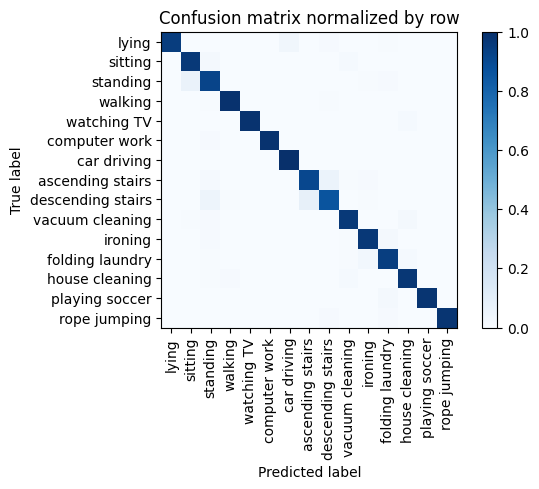

Training Epoch:  47%|████▋     | 7/15 [08:51<10:20, 77.56s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.985      0.993      0.139        613|	 standing: 0.008,	folding laundry: 0.003,	
          ironing       0.978      0.966      0.972      0.114        504|	 folding laundry: 0.020,	standing: 0.008,	
          walking       0.991      0.989      0.990      0.104        459|	 standing: 0.007,	descending stairs: 0.004,	
         standing       0.899      0.920      0.910      0.085        377|	 sitting: 0.066,	folding laundry: 0.008,	
          sitting       0.927      0.962      0.944      0.083        368|	 standing: 0.019,	vacuum cleaning: 0.014,	
            lying       1.000      0.945      0.972      0.083        366|	 car driving: 0.033,	descending stairs: 0.008,	
   house cleaning       0.962      0.970      0.966      0.083        365|	 vacuum cleaning: 0.014,	walking: 0.008,	
  vacuum cleaning       0.953      0.961      0.957


train: 100%|██████████| 276/276 [01:15<00:00,  3.65batch/s, loss=3.35, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:07<00:00,  8.83batch/s, loss=3.33]


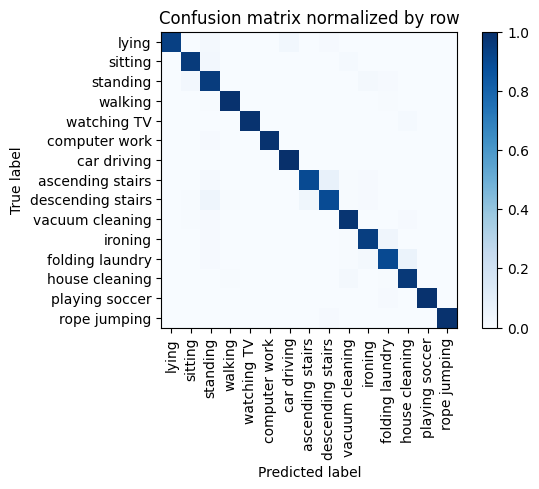

Training Epoch:  53%|█████▎    | 8/15 [10:15<09:17, 79.65s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.985      0.993      0.140        618|	 standing: 0.010,	vacuum cleaning: 0.003,	
          ironing       0.969      0.944      0.957      0.114        504|	 folding laundry: 0.042,	standing: 0.008,	
          walking       0.993      0.989      0.991      0.103        457|	 folding laundry: 0.004,	standing: 0.004,	
         standing       0.886      0.952      0.918      0.085        376|	 sitting: 0.024,	ironing: 0.016,	
   house cleaning       0.947      0.965      0.956      0.083        368|	 vacuum cleaning: 0.019,	folding laundry: 0.005,	
          sitting       0.967      0.954      0.960      0.083        366|	 standing: 0.027,	vacuum cleaning: 0.014,	
            lying       1.000      0.937      0.967      0.082        364|	 car driving: 0.030,	standing: 0.019,	
  vacuum cleaning       0.949      0.978      0.963      0.082


train: 100%|██████████| 276/276 [01:16<00:00,  3.59batch/s, loss=3.35, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:08<00:00,  8.60batch/s, loss=3.01]


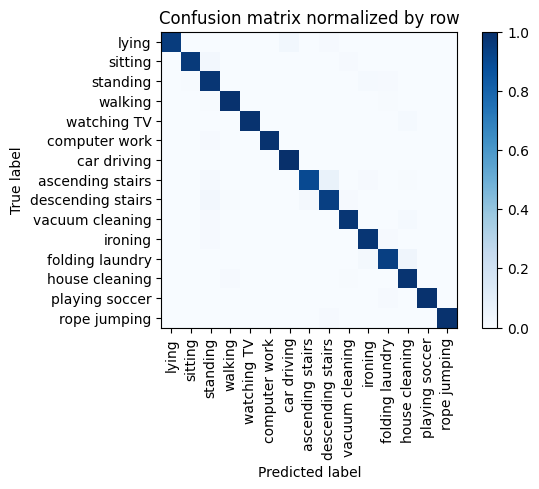

Training Epoch:  60%|██████    | 9/15 [11:41<08:09, 81.52s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.985      0.993      0.139        616|	 standing: 0.008,	folding laundry: 0.003,	
          ironing       0.976      0.976      0.976      0.114        502|	 folding laundry: 0.010,	standing: 0.010,	
          walking       0.991      0.989      0.990      0.104        459|	 folding laundry: 0.004,	standing: 0.004,	
         standing       0.913      0.974      0.942      0.086        378|	 ironing: 0.013,	folding laundry: 0.008,	
   house cleaning       0.950      0.981      0.965      0.083        368|	 walking: 0.008,	vacuum cleaning: 0.005,	
            lying       1.000      0.951      0.975      0.083        366|	 car driving: 0.030,	descending stairs: 0.008,	
          sitting       0.991      0.959      0.975      0.082        364|	 standing: 0.025,	vacuum cleaning: 0.011,	
  vacuum cleaning       0.970      0.975      0.972  


train: 100%|██████████| 276/276 [01:17<00:00,  3.55batch/s, loss=3.48, accuracy=1]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 10.35batch/s, loss=3.17]


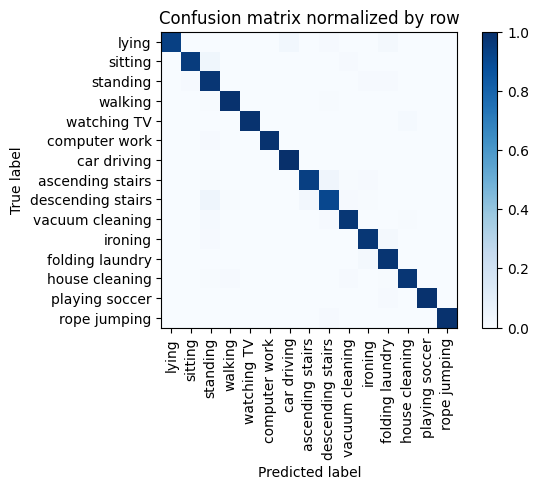

Training Epoch:  67%|██████▋   | 10/15 [13:06<06:53, 82.69s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.985      0.993      0.140        618|	 standing: 0.010,	folding laundry: 0.003,	
          ironing       0.980      0.970      0.975      0.114        503|	 folding laundry: 0.018,	standing: 0.008,	
          walking       0.991      0.989      0.990      0.104        459|	 standing: 0.007,	descending stairs: 0.004,	
         standing       0.893      0.973      0.931      0.085        377|	 sitting: 0.011,	folding laundry: 0.008,	
   house cleaning       0.986      0.973      0.979      0.083        367|	 vacuum cleaning: 0.008,	walking: 0.008,	
          sitting       0.986      0.951      0.968      0.083        367|	 standing: 0.038,	vacuum cleaning: 0.008,	
            lying       1.000      0.934      0.966      0.083        365|	 car driving: 0.030,	folding laundry: 0.022,	
  vacuum cleaning       0.969      0.969      0.969  


train: 100%|██████████| 276/276 [00:57<00:00,  4.81batch/s, loss=3.17, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 10.98batch/s, loss=2.85]


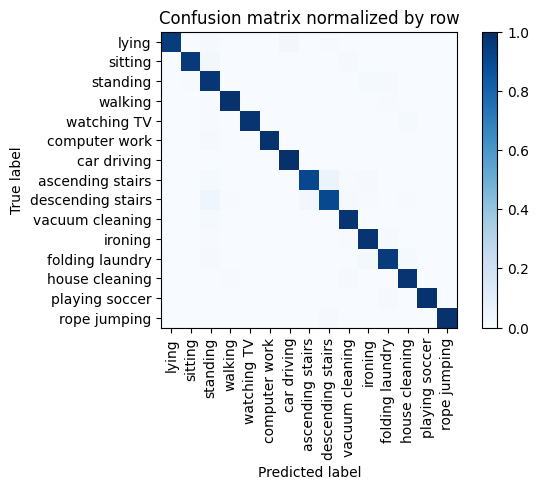

Training Epoch:  73%|███████▎  | 11/15 [14:11<05:08, 77.12s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.139        615|	 standing: 0.010,	vacuum cleaning: 0.002,	
          ironing       0.976      0.980      0.978      0.114        504|	 folding laundry: 0.008,	standing: 0.006,	
          walking       0.993      0.989      0.991      0.104        459|	 folding laundry: 0.004,	standing: 0.004,	
         standing       0.893      0.973      0.931      0.085        376|	 ironing: 0.013,	folding laundry: 0.008,	
   house cleaning       0.973      0.981      0.977      0.083        368|	 vacuum cleaning: 0.008,	walking: 0.005,	
          sitting       0.994      0.962      0.978      0.083        366|	 standing: 0.025,	vacuum cleaning: 0.011,	
            lying       1.000      0.951      0.975      0.083        365|	 car driving: 0.027,	standing: 0.011,	
  vacuum cleaning       0.964      0.983      0.974      0.081


train: 100%|██████████| 276/276 [00:56<00:00,  4.90batch/s, loss=2.92, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 10.71batch/s, loss=3.02]


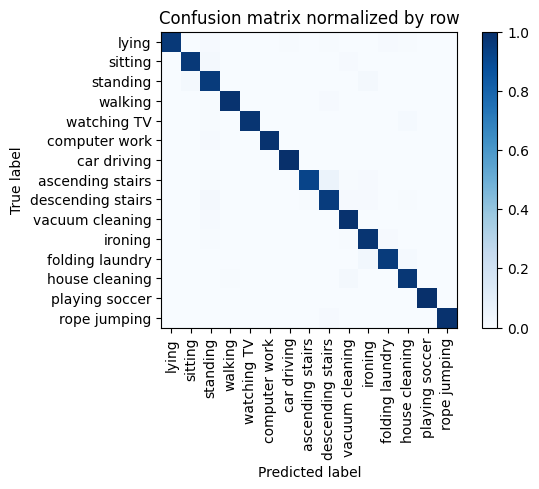

Training Epoch:  80%|████████  | 12/15 [15:14<03:38, 72.93s/it]

Overall accuracy: 0.973

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.139        616|	 standing: 0.010,	vacuum cleaning: 0.003,	
          ironing       0.965      0.978      0.971      0.114        503|	 folding laundry: 0.010,	standing: 0.006,	
          walking       0.996      0.987      0.991      0.103        457|	 descending stairs: 0.009,	standing: 0.004,	
         standing       0.921      0.955      0.938      0.086        378|	 ironing: 0.021,	sitting: 0.021,	
          sitting       0.975      0.965      0.970      0.083        368|	 standing: 0.022,	vacuum cleaning: 0.011,	
            lying       1.000      0.964      0.982      0.083        366|	 folding laundry: 0.011,	standing: 0.008,	
   house cleaning       0.973      0.973      0.973      0.083        365|	 vacuum cleaning: 0.016,	walking: 0.005,	
  vacuum cleaning       0.955      0.989      0.971      0.082  


train: 100%|██████████| 276/276 [00:55<00:00,  4.99batch/s, loss=3.11, accuracy=1]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 10.99batch/s, loss=2.51]


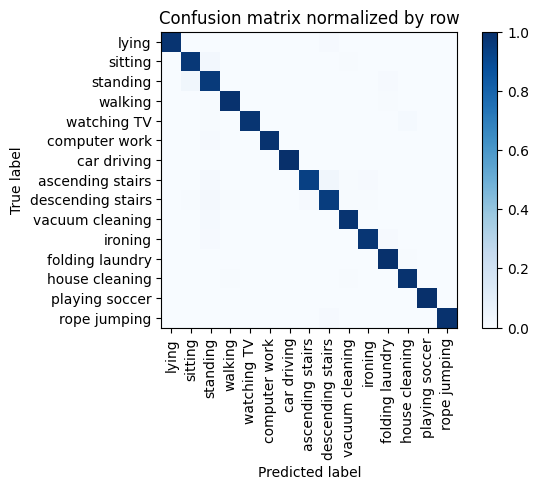

Training Epoch:  87%|████████▋ | 13/15 [16:16<02:19, 69.68s/it]

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.140        618|	 standing: 0.008,	vacuum cleaning: 0.003,	
          ironing       0.994      0.976      0.985      0.113        500|	 folding laundry: 0.010,	standing: 0.010,	
          walking       0.993      0.989      0.991      0.104        459|	 folding laundry: 0.004,	standing: 0.004,	
         standing       0.909      0.960      0.934      0.085        376|	 sitting: 0.032,	folding laundry: 0.008,	
   house cleaning       0.981      0.986      0.984      0.083        367|	 vacuum cleaning: 0.005,	walking: 0.005,	
            lying       1.000      0.981      0.990      0.083        367|	 descending stairs: 0.008,	house cleaning: 0.003,	
          sitting       0.962      0.967      0.965      0.083        366|	 standing: 0.025,	vacuum cleaning: 0.005,	
  vacuum cleaning       0.975      0.983      0.97


train: 100%|██████████| 276/276 [00:54<00:00,  5.02batch/s, loss=3.1, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:05<00:00, 11.74batch/s, loss=2.42]


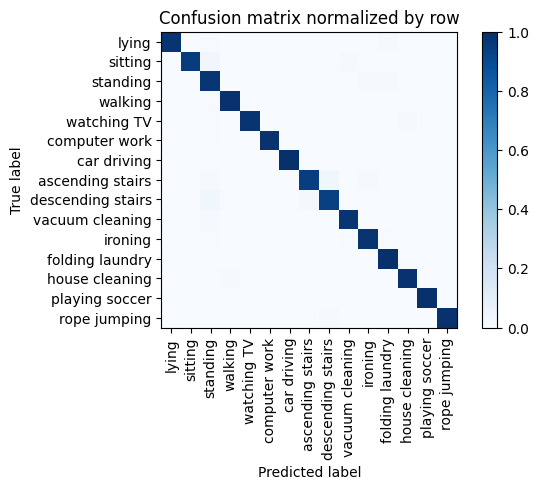

Training Epoch:  93%|█████████▎| 14/15 [17:18<01:07, 67.20s/it]

Overall accuracy: 0.980

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.139        616|	 standing: 0.006,	folding laundry: 0.003,	
          ironing       0.986      0.984      0.985      0.114        505|	 folding laundry: 0.006,	standing: 0.006,	
          walking       0.991      0.991      0.991      0.104        459|	 standing: 0.004,	folding laundry: 0.002,	
         standing       0.904      0.976      0.939      0.085        376|	 ironing: 0.013,	folding laundry: 0.008,	
   house cleaning       0.989      0.986      0.988      0.083        367|	 walking: 0.008,	folding laundry: 0.003,	
          sitting       0.997      0.954      0.975      0.083        366|	 standing: 0.033,	vacuum cleaning: 0.011,	
            lying       1.000      0.983      0.992      0.082        362|	 folding laundry: 0.008,	standing: 0.006,	
  vacuum cleaning       0.978      0.983      0.981      0


train: 100%|██████████| 276/276 [00:55<00:00,  4.97batch/s, loss=2.93, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 69/69 [00:06<00:00, 11.25batch/s, loss=2.91]


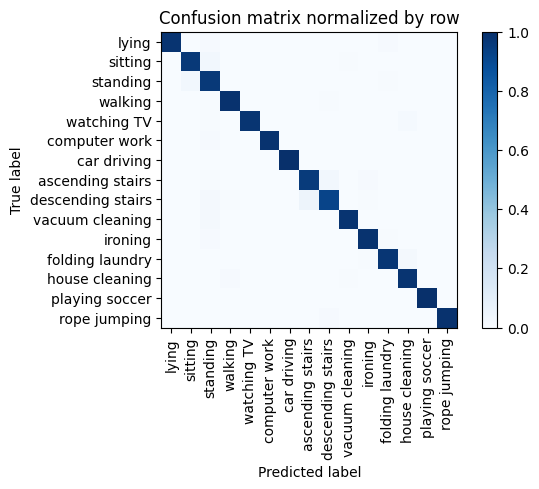

Overall accuracy: 0.977

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.139        614|	 standing: 0.011,	vacuum cleaning: 0.002,	
          ironing       0.990      0.986      0.988      0.113        501|	 standing: 0.010,	folding laundry: 0.004,	
          walking       0.991      0.989      0.990      0.104        458|	 standing: 0.007,	descending stairs: 0.004,	
         standing       0.897      0.963      0.929      0.086        378|	 sitting: 0.029,	folding laundry: 0.005,	
   house cleaning       0.984      0.981      0.982      0.083        368|	 walking: 0.008,	vacuum cleaning: 0.005,	
          sitting       0.970      0.965      0.967      0.083        367|	 standing: 0.030,	vacuum cleaning: 0.005,	
            lying       1.000      0.984      0.992      0.083        366|	 folding laundry: 0.008,	standing: 0.008,	
  vacuum cleaning       0.986      0.981      0.983     

torch.Size([3, 2048])


unseen: 100%|██████████| 68/68 [00:05<00:00, 11.81batch/s, loss=5.22]


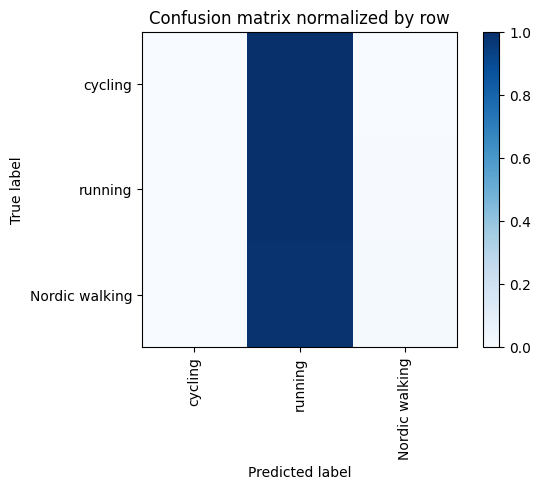

Overall accuracy: 0.222

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.794      0.015      0.029      0.420       1826|	 running: 0.985,	cycling: 0.000,	
       cycling       0.000      0.000      0.000      0.364       1582|	 running: 1.000,	Nordic walking: 0.000,	
       running       0.217      0.993      0.356      0.217        944|	 Nordic walking: 0.007,	cycling: 0.000,	

----------------------------------------------------------------------------------------------------
   avg / total       0.380      0.222      0.089        1.0       4352|	      

{'accuracy': 0.22150735294117646, 'precision': 0.33703875250887755, 'recall': 0.3357903880545294, 'f1': 0.12839020283387076}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 

D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:247: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)
D:\Anaconda\Main\envs\CurrentSOTA\lib\site-packages\numpy\core\_methods.py:213: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 15, 16, 17]
unseen classes >  [13, 9, 14]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 2048])



train: 100%|██████████| 283/283 [00:54<00:00,  5.24batch/s, loss=4.47, accuracy=0.797]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.60batch/s, loss=4.31]


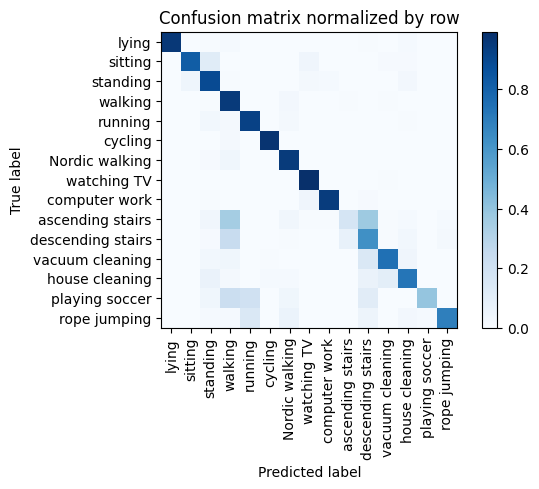

Training Epoch:   7%|▋         | 1/15 [01:00<14:03, 60.27s/it]

Overall accuracy: 0.837

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.945      0.967      0.137        614|	 watching TV: 0.041,	descending stairs: 0.008,	
          walking       0.705      0.953      0.811      0.104        467|	 Nordic walking: 0.026,	standing: 0.006,	
            lying       1.000      0.960      0.980      0.089        399|	 house cleaning: 0.013,	walking: 0.013,	
   house cleaning       0.869      0.726      0.791      0.087        391|	 vacuum cleaning: 0.097,	descending stairs: 0.064,	
          sitting       0.954      0.822      0.883      0.084        377|	 standing: 0.114,	watching TV: 0.040,	
   Nordic walking       0.898      0.950      0.924      0.077        343|	 walking: 0.038,	standing: 0.009,	
         standing       0.735      0.889      0.805      0.077        343|	 sitting: 0.044,	house cleaning: 0.023,	
  vacuum cleaning       0.837      0.746      0.789      0.


train: 100%|██████████| 283/283 [00:56<00:00,  5.01batch/s, loss=3.81, accuracy=0.875]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.45batch/s, loss=3.92]


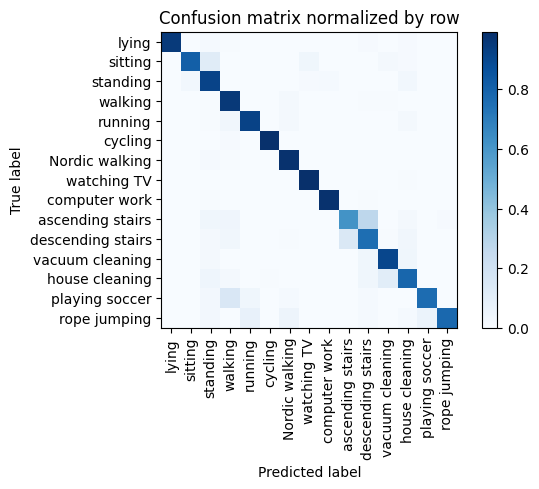

Training Epoch:  13%|█▎        | 2/15 [02:03<13:26, 62.02s/it]

Overall accuracy: 0.900

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.985      0.988      0.138        618|	 standing: 0.006,	descending stairs: 0.005,	
          walking       0.904      0.957      0.930      0.105        470|	 Nordic walking: 0.021,	descending stairs: 0.006,	
            lying       1.000      0.954      0.977      0.088        393|	 standing: 0.015,	house cleaning: 0.010,	
   house cleaning       0.865      0.785      0.823      0.087        391|	 vacuum cleaning: 0.107,	standing: 0.043,	
          sitting       0.968      0.815      0.885      0.083        373|	 standing: 0.115,	watching TV: 0.038,	
         standing       0.760      0.916      0.831      0.077        346|	 house cleaning: 0.029,	sitting: 0.029,	
   Nordic walking       0.941      0.982      0.961      0.076        342|	 standing: 0.012,	walking: 0.006,	
  vacuum cleaning       0.845      0.908      0.875      0.07


train: 100%|██████████| 283/283 [00:57<00:00,  4.95batch/s, loss=3.29, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.77batch/s, loss=3.27]


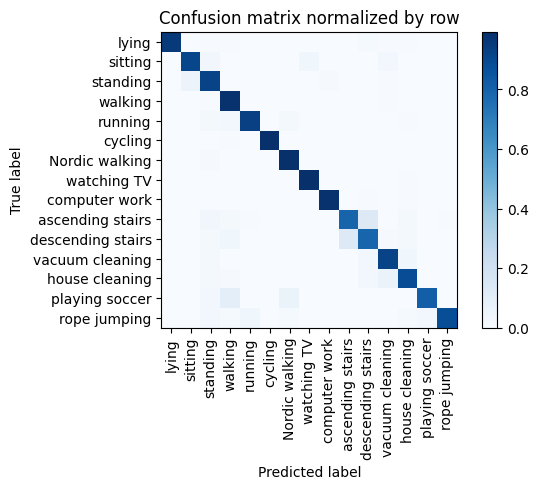

Training Epoch:  20%|██        | 3/15 [03:07<12:33, 62.82s/it]

Overall accuracy: 0.933

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.984      0.989      0.137        612|	 house cleaning: 0.007,	descending stairs: 0.007,	
          walking       0.927      0.983      0.954      0.103        463|	 standing: 0.006,	vacuum cleaning: 0.004,	
            lying       1.000      0.957      0.978      0.089        397|	 descending stairs: 0.013,	house cleaning: 0.008,	
   house cleaning       0.917      0.882      0.899      0.087        390|	 vacuum cleaning: 0.064,	descending stairs: 0.026,	
          sitting       0.944      0.906      0.925      0.083        372|	 watching TV: 0.038,	standing: 0.032,	
   Nordic walking       0.969      0.989      0.979      0.078        348|	 standing: 0.009,	walking: 0.003,	
         standing       0.859      0.919      0.888      0.077        346|	 sitting: 0.055,	computer work: 0.012,	
  vacuum cleaning       0.880      0.916      


train: 100%|██████████| 283/283 [00:53<00:00,  5.31batch/s, loss=3.86, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.69batch/s, loss=3.03]


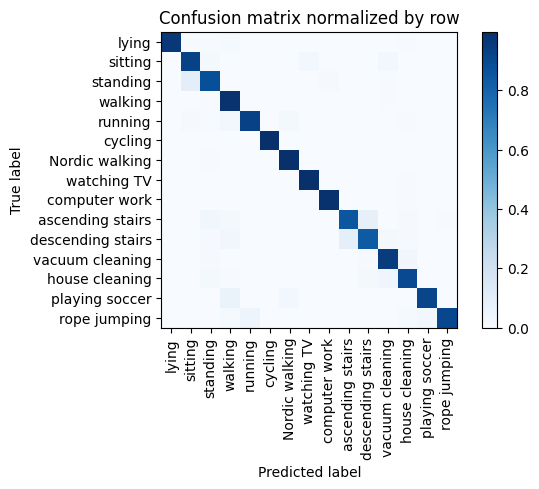

Training Epoch:  27%|██▋       | 4/15 [04:06<11:16, 61.46s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.987      0.989      0.138        619|	 house cleaning: 0.005,	playing soccer: 0.003,	
          walking       0.938      0.983      0.960      0.104        464|	 standing: 0.006,	vacuum cleaning: 0.004,	
            lying       1.000      0.962      0.981      0.089        397|	 walking: 0.013,	standing: 0.008,	
   house cleaning       0.933      0.897      0.914      0.086        387|	 vacuum cleaning: 0.047,	descending stairs: 0.023,	
          sitting       0.893      0.924      0.908      0.083        370|	 watching TV: 0.030,	vacuum cleaning: 0.024,	
   Nordic walking       0.980      0.991      0.986      0.077        347|	 standing: 0.006,	sitting: 0.003,	
         standing       0.886      0.878      0.882      0.077        345|	 sitting: 0.099,	computer work: 0.012,	
  vacuum cleaning       0.898      0.949      0.923      0


train: 100%|██████████| 283/283 [00:51<00:00,  5.45batch/s, loss=3.3, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.35batch/s, loss=3.16]


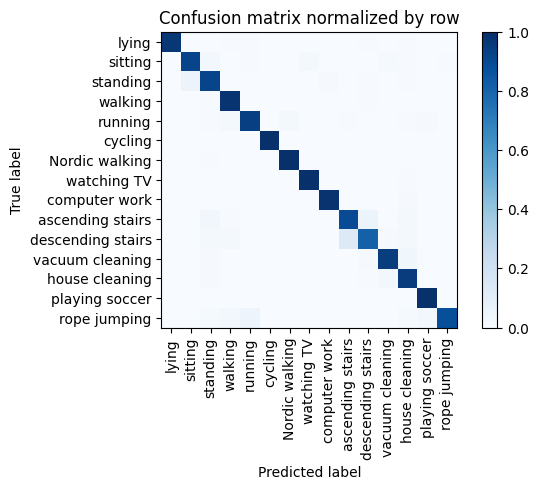

Training Epoch:  33%|███▎      | 5/15 [05:05<10:04, 60.44s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.987      0.991      0.138        619|	 house cleaning: 0.008,	descending stairs: 0.003,	
          walking       0.972      0.983      0.978      0.104        465|	 descending stairs: 0.006,	standing: 0.006,	
            lying       1.000      0.970      0.985      0.088        394|	 house cleaning: 0.008,	descending stairs: 0.008,	
   house cleaning       0.914      0.951      0.932      0.087        390|	 vacuum cleaning: 0.028,	standing: 0.010,	
          sitting       0.943      0.920      0.931      0.084        376|	 standing: 0.029,	watching TV: 0.021,	
         standing       0.901      0.920      0.910      0.078        348|	 sitting: 0.057,	computer work: 0.009,	
   Nordic walking       0.986      0.994      0.990      0.077        347|	 standing: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.946      0.946      0.


train: 100%|██████████| 283/283 [00:53<00:00,  5.28batch/s, loss=3.07, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.56batch/s, loss=3.33]


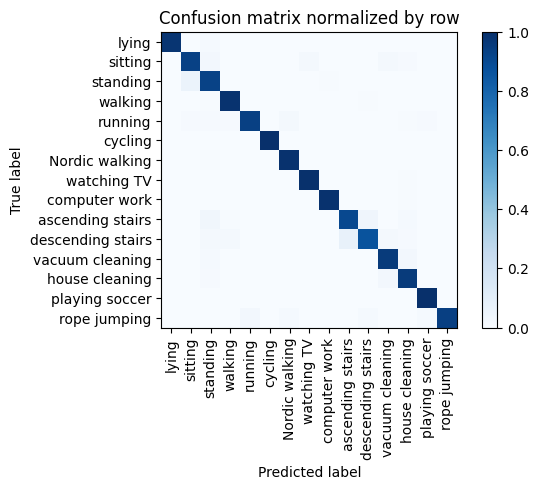

Training Epoch:  40%|████      | 6/15 [06:05<09:03, 60.37s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.989      0.993      0.138        620|	 house cleaning: 0.006,	playing soccer: 0.002,	
          walking       0.985      0.985      0.985      0.104        464|	 descending stairs: 0.004,	standing: 0.004,	
            lying       1.000      0.977      0.989      0.089        398|	 standing: 0.013,	house cleaning: 0.003,	
   house cleaning       0.937      0.957      0.947      0.087        391|	 vacuum cleaning: 0.026,	standing: 0.010,	
          sitting       0.933      0.930      0.932      0.083        373|	 standing: 0.027,	watching TV: 0.019,	
   Nordic walking       0.986      0.991      0.988      0.077        346|	 standing: 0.006,	vacuum cleaning: 0.003,	
         standing       0.885      0.929      0.906      0.076        339|	 sitting: 0.062,	computer work: 0.006,	
  vacuum cleaning       0.930      0.955      0.942      


train: 100%|██████████| 283/283 [00:55<00:00,  5.14batch/s, loss=4.04, accuracy=0.938]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.84batch/s, loss=3.46]


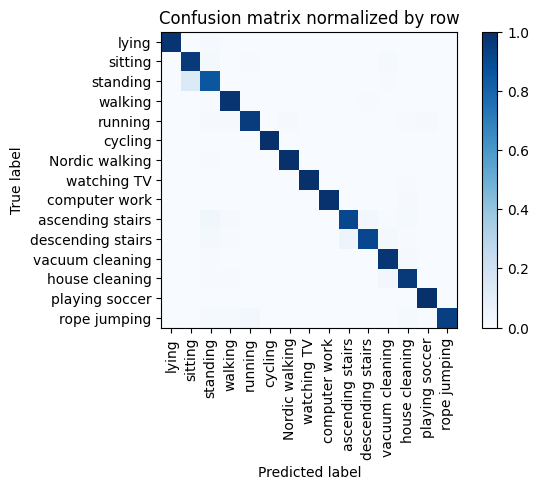

Training Epoch:  47%|████▋     | 7/15 [07:07<08:06, 60.82s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.989      0.993      0.137        615|	 house cleaning: 0.008,	vacuum cleaning: 0.002,	
          walking       0.983      0.983      0.983      0.104        466|	 descending stairs: 0.006,	standing: 0.006,	
            lying       1.000      0.982      0.991      0.089        398|	 standing: 0.010,	house cleaning: 0.003,	
   house cleaning       0.951      0.959      0.955      0.086        387|	 vacuum cleaning: 0.028,	standing: 0.008,	
          sitting       0.885      0.963      0.922      0.084        376|	 standing: 0.019,	vacuum cleaning: 0.013,	
   Nordic walking       0.991      0.994      0.993      0.077        345|	 standing: 0.006,	rope jumping: 0.000,	
         standing       0.891      0.855      0.872      0.077        344|	 sitting: 0.137,	vacuum cleaning: 0.006,	
  vacuum cleaning       0.935      0.976      0.955  


train: 100%|██████████| 283/283 [00:53<00:00,  5.28batch/s, loss=2.88, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.56batch/s, loss=2.64]


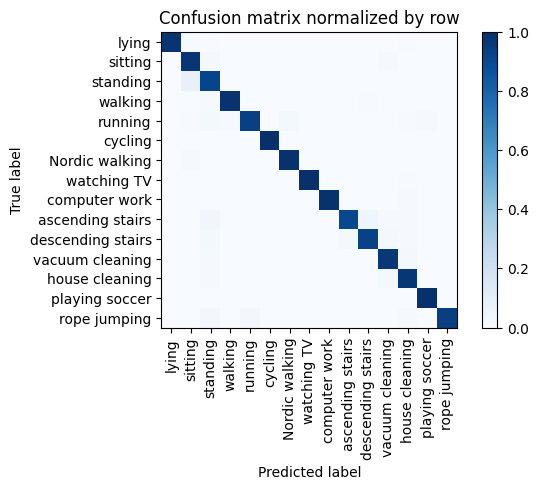

Training Epoch:  53%|█████▎    | 8/15 [08:07<07:04, 60.71s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.138        617|	 house cleaning: 0.008,	standing: 0.003,	
          walking       0.991      0.985      0.988      0.104        465|	 standing: 0.009,	descending stairs: 0.004,	
            lying       1.000      0.977      0.988      0.088        394|	 house cleaning: 0.008,	standing: 0.008,	
   house cleaning       0.940      0.969      0.955      0.087        390|	 vacuum cleaning: 0.018,	standing: 0.010,	
          sitting       0.917      0.973      0.944      0.084        375|	 standing: 0.016,	vacuum cleaning: 0.011,	
   Nordic walking       0.991      0.991      0.991      0.077        346|	 sitting: 0.009,	rope jumping: 0.000,	
         standing       0.893      0.919      0.906      0.077        346|	 sitting: 0.078,	house cleaning: 0.003,	
  vacuum cleaning       0.950      0.967      0.958      0.074


train: 100%|██████████| 283/283 [00:53<00:00,  5.32batch/s, loss=3.08, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.87batch/s, loss=2.85]


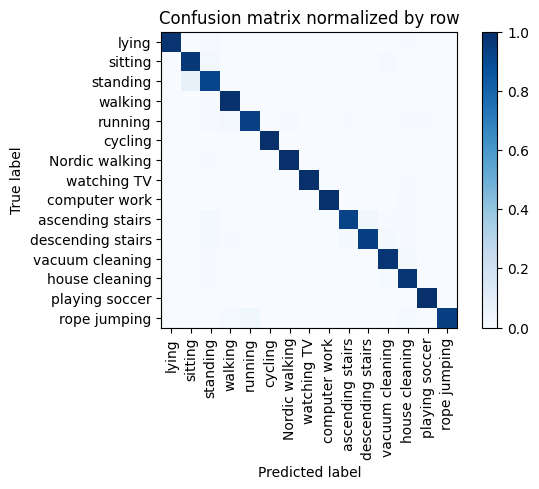

Training Epoch:  60%|██████    | 9/15 [09:07<06:02, 60.46s/it]

Overall accuracy: 0.972

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.138        617|	 house cleaning: 0.008,	standing: 0.003,	
          walking       0.983      0.989      0.986      0.103        462|	 standing: 0.006,	house cleaning: 0.002,	
            lying       1.000      0.980      0.990      0.087        391|	 standing: 0.010,	house cleaning: 0.008,	
   house cleaning       0.947      0.974      0.961      0.086        387|	 vacuum cleaning: 0.016,	standing: 0.005,	
          sitting       0.928      0.965      0.947      0.084        376|	 standing: 0.024,	vacuum cleaning: 0.011,	
         standing       0.904      0.919      0.911      0.077        347|	 sitting: 0.078,	vacuum cleaning: 0.003,	
   Nordic walking       0.994      0.994      0.994      0.077        346|	 standing: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.956      0.976      0.966      0.075 


train: 100%|██████████| 283/283 [00:53<00:00,  5.25batch/s, loss=3.44, accuracy=0.922]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.16batch/s, loss=3]


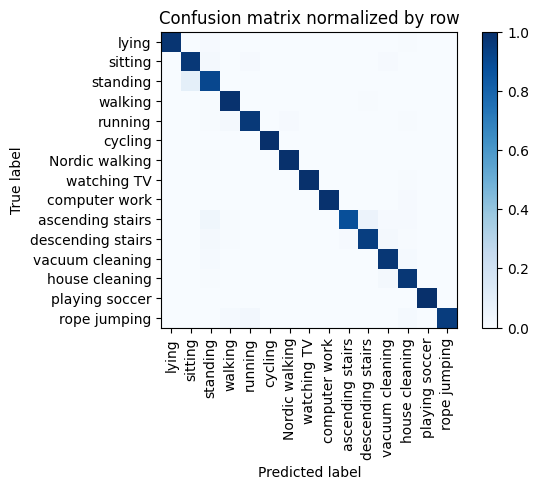

Training Epoch:  67%|██████▋   | 10/15 [10:08<05:02, 60.55s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.137        613|	 house cleaning: 0.008,	standing: 0.003,	
          walking       0.983      0.989      0.986      0.104        464|	 descending stairs: 0.004,	standing: 0.004,	
            lying       1.000      0.977      0.988      0.088        395|	 standing: 0.010,	house cleaning: 0.008,	
   house cleaning       0.950      0.969      0.959      0.087        390|	 vacuum cleaning: 0.021,	standing: 0.005,	
          sitting       0.916      0.965      0.940      0.083        374|	 standing: 0.019,	vacuum cleaning: 0.008,	
         standing       0.897      0.908      0.903      0.077        347|	 sitting: 0.092,	rope jumping: 0.000,	
   Nordic walking       0.994      0.994      0.994      0.077        345|	 standing: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.953      0.970      0.962      0.075 


train: 100%|██████████| 283/283 [00:55<00:00,  5.11batch/s, loss=3.36, accuracy=0.984]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.05batch/s, loss=2.53]


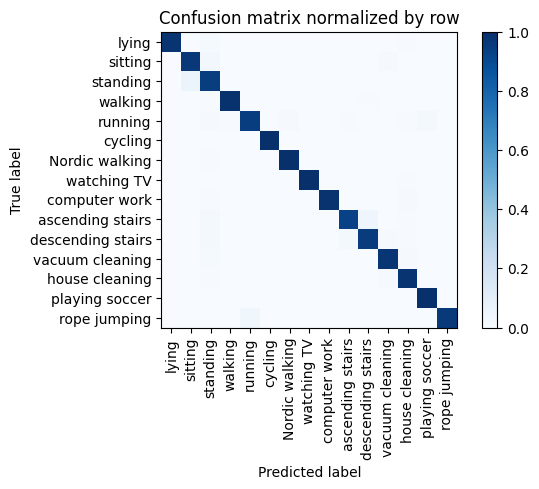

Training Epoch:  73%|███████▎  | 11/15 [11:10<04:04, 61.07s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.137        613|	 house cleaning: 0.008,	standing: 0.005,	
          walking       0.996      0.989      0.992      0.103        462|	 descending stairs: 0.006,	standing: 0.004,	
            lying       1.000      0.977      0.989      0.089        398|	 standing: 0.013,	house cleaning: 0.008,	
   house cleaning       0.962      0.979      0.971      0.087        389|	 vacuum cleaning: 0.010,	standing: 0.005,	
          sitting       0.951      0.966      0.958      0.084        378|	 standing: 0.026,	vacuum cleaning: 0.008,	
   Nordic walking       0.994      0.994      0.994      0.077        345|	 standing: 0.006,	rope jumping: 0.000,	
         standing       0.896      0.948      0.921      0.077        345|	 sitting: 0.052,	rope jumping: 0.000,	
  vacuum cleaning       0.973      0.976      0.975      0.075 


train: 100%|██████████| 283/283 [00:52<00:00,  5.34batch/s, loss=2.84, accuracy=0.969]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.03batch/s, loss=2.44]


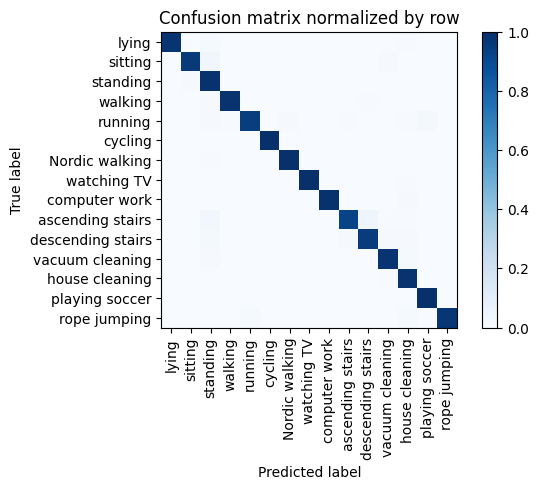

Training Epoch:  80%|████████  | 12/15 [12:10<03:01, 60.55s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.137        615|	 house cleaning: 0.008,	standing: 0.003,	
          walking       0.996      0.985      0.990      0.102        459|	 standing: 0.009,	descending stairs: 0.004,	
            lying       1.000      0.977      0.989      0.088        396|	 standing: 0.013,	house cleaning: 0.008,	
   house cleaning       0.953      0.987      0.970      0.087        388|	 vacuum cleaning: 0.008,	walking: 0.003,	
          sitting       0.989      0.960      0.974      0.084        376|	 standing: 0.032,	vacuum cleaning: 0.008,	
         standing       0.898      0.988      0.941      0.077        346|	 sitting: 0.012,	rope jumping: 0.000,	
   Nordic walking       0.994      0.994      0.994      0.077        344|	 standing: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.973      0.979      0.976      0.075  


train: 100%|██████████| 283/283 [00:52<00:00,  5.37batch/s, loss=2.65, accuracy=0.906]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.16batch/s, loss=2.91]


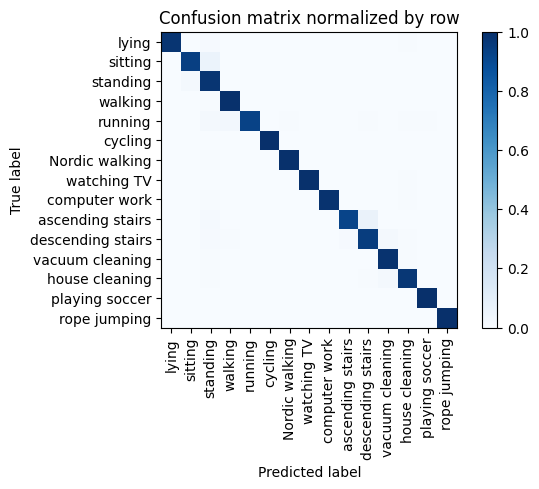

Training Epoch:  87%|████████▋ | 13/15 [13:09<02:00, 60.08s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.987      0.993      0.137        614|	 house cleaning: 0.007,	standing: 0.007,	
          walking       0.985      0.994      0.989      0.104        466|	 standing: 0.004,	house cleaning: 0.002,	
            lying       1.000      0.980      0.990      0.087        392|	 standing: 0.010,	house cleaning: 0.008,	
   house cleaning       0.966      0.969      0.968      0.086        386|	 vacuum cleaning: 0.018,	descending stairs: 0.005,	
          sitting       0.978      0.939      0.958      0.083        374|	 standing: 0.059,	vacuum cleaning: 0.003,	
   Nordic walking       0.997      0.994      0.996      0.078        348|	 standing: 0.006,	rope jumping: 0.000,	
         standing       0.878      0.977      0.925      0.077        345|	 sitting: 0.023,	rope jumping: 0.000,	
  vacuum cleaning       0.965      0.988      0.976      


train: 100%|██████████| 283/283 [00:53<00:00,  5.34batch/s, loss=2.65, accuracy=1]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.13batch/s, loss=3.21]


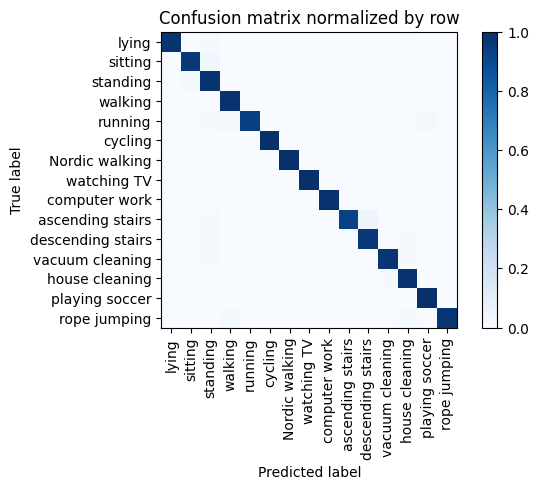

Training Epoch:  93%|█████████▎| 14/15 [14:08<00:59, 59.90s/it]

Overall accuracy: 0.979

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.137        614|	 house cleaning: 0.007,	standing: 0.005,	
          walking       0.989      0.987      0.988      0.104        465|	 descending stairs: 0.006,	standing: 0.004,	
            lying       1.000      0.980      0.990      0.089        399|	 standing: 0.013,	house cleaning: 0.005,	
   house cleaning       0.960      0.985      0.972      0.087        389|	 vacuum cleaning: 0.010,	walking: 0.003,	
          sitting       0.984      0.957      0.970      0.084        376|	 standing: 0.037,	vacuum cleaning: 0.005,	
         standing       0.902      0.980      0.939      0.077        347|	 sitting: 0.017,	descending stairs: 0.003,	
   Nordic walking       0.997      0.994      0.996      0.077        345|	 standing: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.979      0.976      0.977      0.


train: 100%|██████████| 283/283 [00:52<00:00,  5.34batch/s, loss=3.38, accuracy=0.953]


torch.Size([15, 2048])



seen: 100%|██████████| 70/70 [00:05<00:00, 11.83batch/s, loss=2.34]


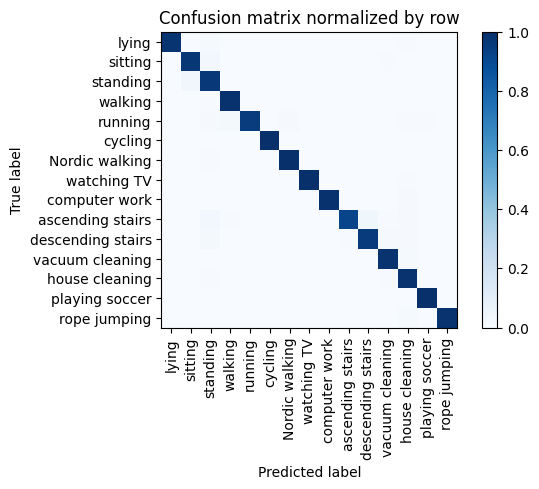

Overall accuracy: 0.980

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.989      0.994      0.138        617|	 house cleaning: 0.008,	standing: 0.003,	
          walking       0.989      0.989      0.989      0.104        464|	 standing: 0.006,	house cleaning: 0.002,	
            lying       1.000      0.980      0.990      0.089        399|	 standing: 0.013,	house cleaning: 0.008,	
   house cleaning       0.950      0.987      0.968      0.087        389|	 vacuum cleaning: 0.005,	standing: 0.005,	
          sitting       0.971      0.971      0.971      0.083        374|	 standing: 0.024,	vacuum cleaning: 0.005,	
   Nordic walking       0.994      0.994      0.994      0.077        345|	 standing: 0.006,	rope jumping: 0.000,	
         standing       0.907      0.968      0.937      0.077        343|	 sitting: 0.032,	rope jumping: 0.000,	
  vacuum cleaning       0.979      0.985      0.982      0.074    

unseen: 100%|██████████| 60/60 [00:04<00:00, 12.76batch/s, loss=5.09]


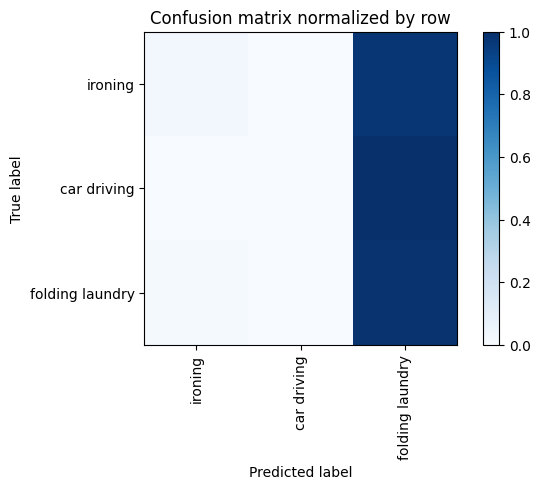

Overall accuracy: 0.264

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.803      0.024      0.047      0.607       2330|	 folding laundry: 0.976,	car driving: 0.000,	
folding laundry       0.254      0.986      0.404      0.253        972|	 ironing: 0.014,	car driving: 0.000,	
    car driving       0.000      0.000      0.000      0.140        538|	 folding laundry: 1.000,	ironing: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.551      0.264      0.131        1.0       3840|	      

{'accuracy': 0.2643229166666667, 'precision': 0.3523319095611967, 'recall': 0.3366867423774116, 'f1': 0.15053812183005258}
============== Overall Unseen Classes Performance ==============


accuracy     0.352014
precision    0.409501
recall       0.393839
f1           0.276664
dtype: float64

In [37]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(), 'feature': nn.MSELoss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
